In [1]:
import pandas as pd
import seaborn as sbn
import matplotlib.pyplot as plt
import collections
import numpy as np
from scipy import stats
from math import ceil

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [2]:
# Opciones de pandas
rows, cols = 400, 100
pd.set_option("display.max.columns", cols)
pd.set_option("display.max.rows", rows)
# Rutas
PATH = "../../data/fundamental_data/"

## 1.1 Data Selection

In [3]:
data = pd.read_csv(PATH+'backup/complete_dataset.csv', header=[0,1], index_col=0, low_memory=False)
data.set_index(pd.DatetimeIndex(list(data.index)).strftime('%Y-%m'), inplace=True)
#data

In [4]:
included_dates = pd.date_range(start='1985-03-01', end='2021-01-01', freq='Q').strftime('%Y-%m')
data.drop(list( set(data.index) - set(included_dates) ), axis=0, inplace=True)
#data

In [5]:
stock_sel = ['NSC', 'GL', 'PEP', 'BDX', 'IBM']
data.drop(list(set(data.columns.get_level_values(1)) - set(stock_sel)), axis=1, level=1, inplace=True)
data

Attributes AccountsPayable                                    \
Symbol                 BDX       GL     IBM     NSC      PEP   
2020-12                NaN      NaN   4.908  0.5520   8.8530   
2020-09            1.35500      NaN   3.985  1.2730  19.3200   
2020-06                NaN      NaN   4.719  1.2680  17.2200   
2020-03                NaN      NaN   4.172  1.2840  16.2000   
2019-12                NaN      NaN   4.896  0.7100   8.0130   
2019-09            1.09200      NaN   4.042  1.4070  17.2100   
2019-06                NaN      NaN   4.724  1.4070  16.4600   
2019-03                NaN      NaN   5.711  1.3340  15.8000   
2018-12                NaN      NaN   6.558  0.8280   7.2130   
2018-09            1.10600      NaN   5.384  1.3940  15.2300   
2018-06                NaN      NaN   5.518  1.3230  14.6000   
2018-03                NaN      NaN   5.736  1.2170  14.2800   
2017-12                NaN      NaN   6.451  0.8220   6.7270   
2017-09            0.79700      NaN   5.442  1.2870  14.6400   
2017-06                NaN      NaN   5.126  1.2230  13.8300   
2017-03                NaN      NaN   5.324  1.2110  13.0700   
2016-12                NaN      NaN   6.209  0.6500   6.1580   
2016-09            0.66500      NaN   5.271  1.1310  14.3000   
2016-06                NaN      NaN   5.484  1.0850  13.6800   
2016-03                NaN      NaN   5.302  1.1190  12.8200   
2015-12                NaN      NaN   6.028  0.6020   5.5460   
2015-09            0.63100      NaN   5.166  1.1600  13.5500   
2015-06                NaN      NaN   5.943  1.1440  13.1600   
2015-03                NaN      NaN   6.314  1.0940  12.1600   
2014-12                NaN      NaN   6.864  0.7480   5.1270   
2014-09            0.40100      NaN   5.855  1.3870  13.5900   
2014-06                NaN      NaN   6.271  1.2450  12.9900   
2014-03                NaN      NaN   6.865  1.1940  11.6200   
2013-12                NaN      NaN   7.461  0.6850   4.8740   
2013-09            0.33300      NaN   6.263  1.2670  12.2100   
2013-06                NaN      NaN   6.821  1.1800  12.1000   
2013-03                NaN      NaN   7.203  1.1880  11.2400   
2012-12                NaN      NaN   7.952  0.7770   4.4510   
2012-09            0.35000  0.23618   7.085  1.2600  11.7200   
2012-06                NaN  0.22165   7.482  1.1260  11.1500   
2012-03                NaN  0.24119   7.416  1.2430  11.1800   
2011-12                NaN      NaN   8.517  0.4990   4.0830   
2011-09            0.30484  0.22716   7.093  1.3290  11.5200   
2011-06                NaN  0.21113   7.112  1.2540  11.4300   
2011-03                NaN  0.22907   6.747  1.0930  10.2400   
2010-12                NaN  0.22160   7.804  1.1810   3.8650   
2010-09            0.32540      NaN   7.084  1.1310  10.7000   
2010-06                NaN      NaN   7.233  1.0640   9.8430   
2010-03                NaN      NaN   6.345  0.9870   9.5530   
2009-12                NaN      NaN   7.436  0.9740   8.1270   
2009-09            0.26418      NaN   6.145  0.9800   8.1410   
2009-06                NaN      NaN   5.869  0.9450   7.7720   
2009-03                NaN      NaN   5.878  0.9520   7.5560   
2008-12            1.22900      NaN   7.014  1.1400   8.2730   
2008-09            0.26088      NaN   6.770  1.2250   8.0110   
2008-06            1.26200      NaN   7.531  1.1140   7.9860   
2008-03            1.17100      NaN   7.329  1.3370   7.3860   
2007-12            1.28900      NaN   8.054  1.1390   7.6020   
2007-09            0.26699      NaN   6.732  1.1270   7.2910   
2007-06            1.20900      NaN   6.653  1.1580   6.8700   
2007-03            1.13800      NaN   6.859  1.0840   6.2070   
2006-12                NaN      NaN   7.964  1.1810   2.1020   
2006-09            0.24360      NaN  22.250  1.1680   6.4980   
2006-06            1.05800      NaN  22.400  1.1150   6.1840   
2006-03            0.98130      NaN  22.210  1.0360   5.5870   
2005-12            1.14700      

In [6]:
feats_dict = dict()
for stock in stock_sel:
    df = data.xs(stock, level=1, axis=1)
    for feature in df.columns:
        nas = df[feature].isnull().sum()
        if feature not in feats_dict.keys():
            feats_dict[feature] = {'counts':1, 'na_counts':nas}
        else:
            feats_dict[feature]['counts'] += 1
            feats_dict[feature]['na_counts'] += nas

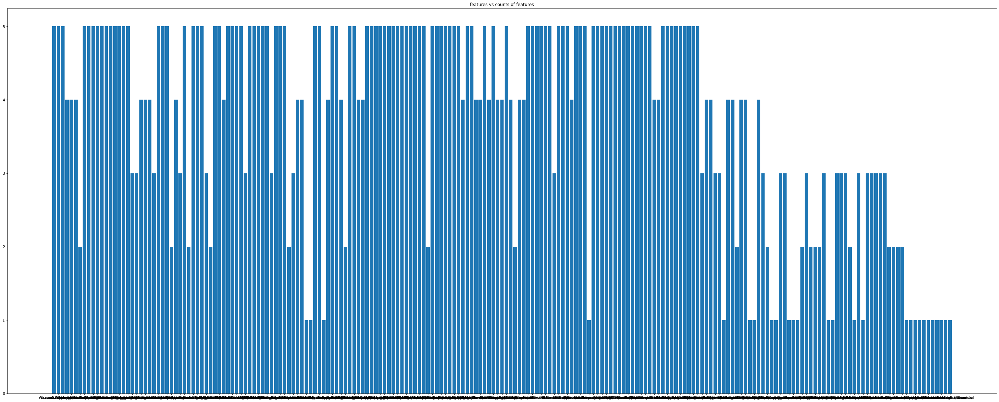

In [7]:
cant = pd.Series(dtype='int64')
for feat in feats_dict.items():
    cant[feat[0]] = feat[1]['counts']
fig,ax1 = plt.subplots(figsize=(50,20))
plt.title('features vs counts of features')
plt.bar(cant.index, cant.values)
plt.show()

In [8]:
sel_feats = pd.Series(dtype='int64')
for feat in feats_dict.items():
    if feat[1]['counts'] == len(stock_sel):
        sel_feats[feat[0]] = feat[1]['na_counts']
display(sel_feats.sort_values(ascending=True))
display(len(sel_feats))

IncomefromContinuingOperations                        0
PricePerShare                                         0
NetIncome(TTM)                                        0
AverageBasicSharesOutstanding                         0
AverageDilutedSharesOutstanding                       0
P/S                                                   0
Revenue(TTM)                                          0
OperatingRevenue                                      0
Revenue                                               0
NetIncome                                             0
EPSDiluted                                            9
EPSBasic                                              9
NormalizedDilutedEPS                                 13
EPSDilutedfromContinuingOperations                   13
EPSBasicfromContinuingOperations                     13
NormalizedBasicEPS                                   13
EBIT                                                 17
EPSDiluted(TTM)                                 

102

In [9]:
sel_feats = sel_feats.to_frame(name='na_values')
z_scores = stats.zscore(sel_feats)
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 1.5).all(axis=1)
sel_feats = sel_feats[filtered_entries]

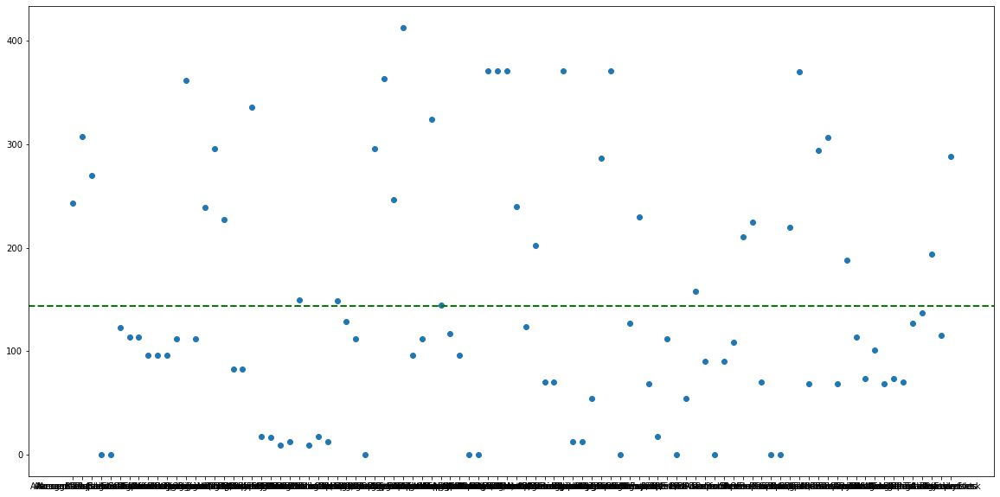

In [10]:
fig,ax1 = plt.subplots(figsize=(20,10))
plt.scatter(sel_feats.index, sel_feats['na_values'])
plt.axhline(ceil(sel_feats['na_values'].mean()), color='green', linewidth=2, linestyle='--')
plt.show()

In [11]:
sel_feats = sel_feats[sel_feats['na_values'] <= ceil(sel_feats['na_values'].mean())]
display(sel_feats)
display(sel_feats.shape)

,na_values
AverageBasicSharesOutstanding,0
AverageDilutedSharesOutstanding,0
BeginningCash,123
CashandEquivalents,114
CashandShortTermInvestments,114
CashfromFinancing,96
CashfromInvesting,96
CashfromOperations,96
CashfromOperations(TTM),112
ChangeinCash,112


(59, 1)

In [12]:
include = list(sel_feats.index)
data.drop(list(set(data.columns.get_level_values(0)) - set(include)), level=0, axis=1, inplace=True)
data

Attributes AverageBasicSharesOutstanding                                    \
Symbol                               BDX       GL      IBM      NSC    PEP   
2020-12                          0.29059  0.10420  0.89260  0.25330  1.379   
2020-09                          0.29043  0.10615  0.89140  0.25460  1.384   
2020-06                          0.28238  0.10644  0.88944  0.25540  1.387   
2020-03                          0.27201  0.10729  0.88800  0.25730  1.390   
2019-12                          0.27110  0.10811  0.88704  0.25940  1.393   
2019-09                          0.27062  0.10881  0.88600  0.26210  1.397   
2019-06                          0.27025  0.10965  0.88627  0.26480  1.401   
2019-03                          0.26988  0.11030  0.88960  0.26710  1.406   
2018-12                          0.26904  0.11139  0.90139  0.27050  1.409   
2018-09                          0.26861  0.11259  0.91120  0.27550  1.414   
2018-06                          0.26784  0.11335  0.91510  0.28130  1.417   
2018-03                          0.26734  0.11418  0.92068  0.28350  1.420   
2017-12                          0.23004  0.11505  0.92451  0.28520  1.419   
2017-09                          0.22832  0.11592  0.92944  0.28710  1.425   
2017-06                          0.22081  0.11665  0.93492  0.28900  1.428   
2017-03                          0.21358  0.11777  0.94244  0.29030  1.428   
2016-12                          0.21306  0.11857  0.94861  0.29090  1.427   
2016-09                          0.21358  0.11948  0.95400  0.29270  1.438   
2016-06                          0.21308  0.12048  0.95740  0.29470  1.443   
2016-03                          0.21247  0.12148  0.96170  0.29720  1.446   
2015-12                          0.21169  0.12301  0.96958  0.30010  1.451   
2015-09                          0.21108  0.12446  0.97510  0.30010  1.467   
2015-06                          0.21018  0.12582  0.98230  0.30290  1.476   
2015-03                          0.19608  0.12712  0.98810  0.30680  1.484   
2014-12                          0.19284  0.12830  0.99039  0.30910  1.491   
2014-09                          0.19232  0.12997  0.99180  0.30940  1.507   
2014-06                          0.19305  0.13149  0.99960  0.30950  1.515   
2014-03                          0.19361  0.13316  1.03500  0.30950  1.524   
2013-12                          0.19420  0.13506  1.07300  0.30860  1.529   
2013-09                          0.19469  0.13690  1.09100  0.31040  1.542   
2013-06                          0.19488  0.13829  1.10100  0.31410  1.548   
2013-03                          0.19461  0.14037  1.11400  0.31450  1.544   
2012-12                          0.19643  0.14159  1.12500  0.31490  1.542   
2012-09                          0.19902  0.14269  1.13700  0.31770  1.556   
2012-06                          0.20202  0.14534  1.14900  0.32270  1.563   
2012-03                          0.20643  0.15010  1.15900  0.32830  1.568   
2011-12                          0.21430  0.15195  1.17200  0.33260  1.561   
2011-09                          0.21668  0.15717  1.18900  0.34320  1.578   
2011-06                          0.21897  0.16652  1.20500  0.35100  1.583   
2011-03                          0.22089  0.17523  1.22200  0.35520  1.583   
2010-12                          0.22808  0.17942  1.24000  0.36050  1.581   
2010-09                          0.23136  0.18175  1.25500  0.36630  1.588   
2010-06                          0.23324  0.27681  1.27900  0.36970  1.608   
2010-03                          0.23532  0.18640  1.30100  0.36950  1.582   
2009-12                          0.23736  0.18628  1.31800  0.36800  1.561   
2009-09                          0.23915  0.18618  1.32000  0.36730  1.558   
2009-06                          0.24011  0.18615  1.32600  0.36680  1.557   
2009-03                          0.24024  0.18872  1.34400  0.36620  1.555   
2008-12                          0.24240  0.19117  1.34700  0.36600  1.546   
2008-09               

In [13]:
for stock in stock_sel:
    data['Prediction', stock] = data['PricePerShare', stock].shift(1)
data

Attributes AverageBasicSharesOutstanding                                    \
Symbol                               BDX       GL      IBM      NSC    PEP   
2020-12                          0.29059  0.10420  0.89260  0.25330  1.379   
2020-09                          0.29043  0.10615  0.89140  0.25460  1.384   
2020-06                          0.28238  0.10644  0.88944  0.25540  1.387   
2020-03                          0.27201  0.10729  0.88800  0.25730  1.390   
2019-12                          0.27110  0.10811  0.88704  0.25940  1.393   
2019-09                          0.27062  0.10881  0.88600  0.26210  1.397   
2019-06                          0.27025  0.10965  0.88627  0.26480  1.401   
2019-03                          0.26988  0.11030  0.88960  0.26710  1.406   
2018-12                          0.26904  0.11139  0.90139  0.27050  1.409   
2018-09                          0.26861  0.11259  0.91120  0.27550  1.414   
2018-06                          0.26784  0.11335  0.91510  0.28130  1.417   
2018-03                          0.26734  0.11418  0.92068  0.28350  1.420   
2017-12                          0.23004  0.11505  0.92451  0.28520  1.419   
2017-09                          0.22832  0.11592  0.92944  0.28710  1.425   
2017-06                          0.22081  0.11665  0.93492  0.28900  1.428   
2017-03                          0.21358  0.11777  0.94244  0.29030  1.428   
2016-12                          0.21306  0.11857  0.94861  0.29090  1.427   
2016-09                          0.21358  0.11948  0.95400  0.29270  1.438   
2016-06                          0.21308  0.12048  0.95740  0.29470  1.443   
2016-03                          0.21247  0.12148  0.96170  0.29720  1.446   
2015-12                          0.21169  0.12301  0.96958  0.30010  1.451   
2015-09                          0.21108  0.12446  0.97510  0.30010  1.467   
2015-06                          0.21018  0.12582  0.98230  0.30290  1.476   
2015-03                          0.19608  0.12712  0.98810  0.30680  1.484   
2014-12                          0.19284  0.12830  0.99039  0.30910  1.491   
2014-09                          0.19232  0.12997  0.99180  0.30940  1.507   
2014-06                          0.19305  0.13149  0.99960  0.30950  1.515   
2014-03                          0.19361  0.13316  1.03500  0.30950  1.524   
2013-12                          0.19420  0.13506  1.07300  0.30860  1.529   
2013-09                          0.19469  0.13690  1.09100  0.31040  1.542   
2013-06                          0.19488  0.13829  1.10100  0.31410  1.548   
2013-03                          0.19461  0.14037  1.11400  0.31450  1.544   
2012-12                          0.19643  0.14159  1.12500  0.31490  1.542   
2012-09                          0.19902  0.14269  1.13700  0.31770  1.556   
2012-06                          0.20202  0.14534  1.14900  0.32270  1.563   
2012-03                          0.20643  0.15010  1.15900  0.32830  1.568   
2011-12                          0.21430  0.15195  1.17200  0.33260  1.561   
2011-09                          0.21668  0.15717  1.18900  0.34320  1.578   
2011-06                          0.21897  0.16652  1.20500  0.35100  1.583   
2011-03                          0.22089  0.17523  1.22200  0.35520  1.583   
2010-12                          0.22808  0.17942  1.24000  0.36050  1.581   
2010-09                          0.23136  0.18175  1.25500  0.36630  1.588   
2010-06                          0.23324  0.27681  1.27900  0.36970  1.608   
2010-03                          0.23532  0.18640  1.30100  0.36950  1.582   
2009-12                          0.23736  0.18628  1.31800  0.36800  1.561   
2009-09                          0.23915  0.18618  1.32000  0.36730  1.558   
2009-06                          0.24011  0.18615  1.32600  0.36680  1.557   
2009-03                          0.24024  0.18872  1.34400  0.36620  1.555   
2008-12                          0.24240  0.19117  1.34700  0.36600  1.546   
2008-09               

In [14]:
for stock in stock_sel:
    data['QMonth', stock] = pd.DatetimeIndex(list(data.index)).strftime('%m')
data

Attributes AverageBasicSharesOutstanding                                    \
Symbol                               BDX       GL      IBM      NSC    PEP   
2020-12                          0.29059  0.10420  0.89260  0.25330  1.379   
2020-09                          0.29043  0.10615  0.89140  0.25460  1.384   
2020-06                          0.28238  0.10644  0.88944  0.25540  1.387   
2020-03                          0.27201  0.10729  0.88800  0.25730  1.390   
2019-12                          0.27110  0.10811  0.88704  0.25940  1.393   
2019-09                          0.27062  0.10881  0.88600  0.26210  1.397   
2019-06                          0.27025  0.10965  0.88627  0.26480  1.401   
2019-03                          0.26988  0.11030  0.88960  0.26710  1.406   
2018-12                          0.26904  0.11139  0.90139  0.27050  1.409   
2018-09                          0.26861  0.11259  0.91120  0.27550  1.414   
2018-06                          0.26784  0.11335  0.91510  0.28130  1.417   
2018-03                          0.26734  0.11418  0.92068  0.28350  1.420   
2017-12                          0.23004  0.11505  0.92451  0.28520  1.419   
2017-09                          0.22832  0.11592  0.92944  0.28710  1.425   
2017-06                          0.22081  0.11665  0.93492  0.28900  1.428   
2017-03                          0.21358  0.11777  0.94244  0.29030  1.428   
2016-12                          0.21306  0.11857  0.94861  0.29090  1.427   
2016-09                          0.21358  0.11948  0.95400  0.29270  1.438   
2016-06                          0.21308  0.12048  0.95740  0.29470  1.443   
2016-03                          0.21247  0.12148  0.96170  0.29720  1.446   
2015-12                          0.21169  0.12301  0.96958  0.30010  1.451   
2015-09                          0.21108  0.12446  0.97510  0.30010  1.467   
2015-06                          0.21018  0.12582  0.98230  0.30290  1.476   
2015-03                          0.19608  0.12712  0.98810  0.30680  1.484   
2014-12                          0.19284  0.12830  0.99039  0.30910  1.491   
2014-09                          0.19232  0.12997  0.99180  0.30940  1.507   
2014-06                          0.19305  0.13149  0.99960  0.30950  1.515   
2014-03                          0.19361  0.13316  1.03500  0.30950  1.524   
2013-12                          0.19420  0.13506  1.07300  0.30860  1.529   
2013-09                          0.19469  0.13690  1.09100  0.31040  1.542   
2013-06                          0.19488  0.13829  1.10100  0.31410  1.548   
2013-03                          0.19461  0.14037  1.11400  0.31450  1.544   
2012-12                          0.19643  0.14159  1.12500  0.31490  1.542   
2012-09                          0.19902  0.14269  1.13700  0.31770  1.556   
2012-06                          0.20202  0.14534  1.14900  0.32270  1.563   
2012-03                          0.20643  0.15010  1.15900  0.32830  1.568   
2011-12                          0.21430  0.15195  1.17200  0.33260  1.561   
2011-09                          0.21668  0.15717  1.18900  0.34320  1.578   
2011-06                          0.21897  0.16652  1.20500  0.35100  1.583   
2011-03                          0.22089  0.17523  1.22200  0.35520  1.583   
2010-12                          0.22808  0.17942  1.24000  0.36050  1.581   
2010-09                          0.23136  0.18175  1.25500  0.36630  1.588   
2010-06                          0.23324  0.27681  1.27900  0.36970  1.608   
2010-03                          0.23532  0.18640  1.30100  0.36950  1.582   
2009-12                          0.23736  0.18628  1.31800  0.36800  1.561   
2009-09                          0.23915  0.18618  1.32000  0.36730  1.558   
2009-06                          0.24011  0.18615  1.32600  0.36680  1.557   
2009-03                          0.24024  0.18872  1.34400  0.36620  1.555   
2008-12                          0.24240  0.19117  1.34700  0.36600  1.546   
2008-09               

In [15]:
data.to_csv(PATH+'PCA_features_dataset.csv')

## 1.2 Data Analysis

In [16]:
data = pd.read_csv(PATH+'PCA_features_dataset.csv', header=[0,1], index_col=0, low_memory=False)
data.set_index(pd.DatetimeIndex(list(data.index)).strftime('%Y-%m'), inplace=True)
data

Attributes AverageBasicSharesOutstanding                                    \
Symbol                               BDX       GL      IBM      NSC    PEP   
2020-12                          0.29059  0.10420  0.89260  0.25330  1.379   
2020-09                          0.29043  0.10615  0.89140  0.25460  1.384   
2020-06                          0.28238  0.10644  0.88944  0.25540  1.387   
2020-03                          0.27201  0.10729  0.88800  0.25730  1.390   
2019-12                          0.27110  0.10811  0.88704  0.25940  1.393   
2019-09                          0.27062  0.10881  0.88600  0.26210  1.397   
2019-06                          0.27025  0.10965  0.88627  0.26480  1.401   
2019-03                          0.26988  0.11030  0.88960  0.26710  1.406   
2018-12                          0.26904  0.11139  0.90139  0.27050  1.409   
2018-09                          0.26861  0.11259  0.91120  0.27550  1.414   
2018-06                          0.26784  0.11335  0.91510  0.28130  1.417   
2018-03                          0.26734  0.11418  0.92068  0.28350  1.420   
2017-12                          0.23004  0.11505  0.92451  0.28520  1.419   
2017-09                          0.22832  0.11592  0.92944  0.28710  1.425   
2017-06                          0.22081  0.11665  0.93492  0.28900  1.428   
2017-03                          0.21358  0.11777  0.94244  0.29030  1.428   
2016-12                          0.21306  0.11857  0.94861  0.29090  1.427   
2016-09                          0.21358  0.11948  0.95400  0.29270  1.438   
2016-06                          0.21308  0.12048  0.95740  0.29470  1.443   
2016-03                          0.21247  0.12148  0.96170  0.29720  1.446   
2015-12                          0.21169  0.12301  0.96958  0.30010  1.451   
2015-09                          0.21108  0.12446  0.97510  0.30010  1.467   
2015-06                          0.21018  0.12582  0.98230  0.30290  1.476   
2015-03                          0.19608  0.12712  0.98810  0.30680  1.484   
2014-12                          0.19284  0.12830  0.99039  0.30910  1.491   
2014-09                          0.19232  0.12997  0.99180  0.30940  1.507   
2014-06                          0.19305  0.13149  0.99960  0.30950  1.515   
2014-03                          0.19361  0.13316  1.03500  0.30950  1.524   
2013-12                          0.19420  0.13506  1.07300  0.30860  1.529   
2013-09                          0.19469  0.13690  1.09100  0.31040  1.542   
2013-06                          0.19488  0.13829  1.10100  0.31410  1.548   
2013-03                          0.19461  0.14037  1.11400  0.31450  1.544   
2012-12                          0.19643  0.14159  1.12500  0.31490  1.542   
2012-09                          0.19902  0.14269  1.13700  0.31770  1.556   
2012-06                          0.20202  0.14534  1.14900  0.32270  1.563   
2012-03                          0.20643  0.15010  1.15900  0.32830  1.568   
2011-12                          0.21430  0.15195  1.17200  0.33260  1.561   
2011-09                          0.21668  0.15717  1.18900  0.34320  1.578   
2011-06                          0.21897  0.16652  1.20500  0.35100  1.583   
2011-03                          0.22089  0.17523  1.22200  0.35520  1.583   
2010-12                          0.22808  0.17942  1.24000  0.36050  1.581   
2010-09                          0.23136  0.18175  1.25500  0.36630  1.588   
2010-06                          0.23324  0.27681  1.27900  0.36970  1.608   
2010-03                          0.23532  0.18640  1.30100  0.36950  1.582   
2009-12                          0.23736  0.18628  1.31800  0.36800  1.561   
2009-09                          0.23915  0.18618  1.32000  0.36730  1.558   
2009-06                          0.24011  0.18615  1.32600  0.36680  1.557   
2009-03                          0.24024  0.18872  1.34400  0.36620  1.555   
2008-12                          0.24240  0.19117  1.34700  0.36600  1.546   
2008-09               

In [17]:
data.shape

(144, 305)

In [18]:
data.xs('IBM', level=1, axis=1).shape

(144, 61)

In [19]:
# Attributes data types
data.xs('IBM', level=1, axis=1).dtypes

Attributes
AverageBasicSharesOutstanding                       float64
AverageDilutedSharesOutstanding                     float64
BeginningCash                                       float64
CashandEquivalents                                  float64
CashandShortTermInvestments                         float64
CashfromFinancing                                   float64
CashfromInvesting                                   float64
CashfromOperations                                  float64
CashfromOperations(TTM)                             float64
ChangeinCash                                        float64
CurrentDebt&CapitalLeaseObligation                  float64
CurrentPortionofLongTermDebt                        float64
DividendPerShare                                    float64
EBIT                                                float64
EPSBasic                                            float64
EPSBasicfromContinuingOperations                    float64
EPSDiluted                   

In [20]:
# Central stats per stock
stock_sel = ['NSC', 'GL', 'PEP', 'BDX', 'IBM']
for stock in stock_sel:
    display(stock)
    display(data.xs(stock, level=1, axis=1).describe())

'NSC'

Attributes,AverageBasicSharesOutstanding,AverageDilutedSharesOutstanding,BeginningCash,CashandEquivalents,CashandShortTermInvestments,CashfromFinancing,CashfromInvesting,CashfromOperations,CashfromOperations(TTM),ChangeinCash,CurrentDebt&CapitalLeaseObligation,CurrentPortionofLongTermDebt,DividendPerShare,EBIT,EPSBasic,EPSBasicfromContinuingOperations,EPSDiluted,EPSDiluted(TTM),EPSDilutedfromContinuingOperations,EndingCash,FCF,IncomefromContinuingOperations,NetChangeinCapitalExpenditures,NetChangeinCapitalExpenditures(TTM),NetCommonEquityIssued(Purchased),NetDebtIssuance,NetIncome,NetIncome(TTM),NetPP&E,Non-CurrentPortionofLTDandCapitalLeaseObligation,Non-CurrentPortionofLongTermDebt,NormalizedBasicEPS,NormalizedDilutedEPS,NormalizedIncome,OperatingRevenue,OtherIncomeandExpenses,P/B,P/E,P/FCF,P/S,PEG,Pre-TaxIncome,PricePerShare,ProvisionforIncomeTaxes,ROE,RetainedEarnings,Revenue,Revenue(TTM),ShareholdersEquity,TotalAssets,TotalCurrentAssets,TotalCurrentLiabilities,TotalDividendsPaid,TotalLiabilities,TotalLongTermAssets,TotalLongTermLiabilities,TotalNetChangeinInvestments,TotalOperatingExpenses,TotalReceivables,Prediction,QMonth
count,144.000000,144.000000,112.000000,131.000000,131.000000,124.000000,124.000000,124.000000,121.000000,108.000000,131.000000,131.000000,140.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,111.00000,121.000000,144.000000,124.000000,121.000000,123.000000,124.000000,144.000000,144.000000,131.000000,131.000000,131.000000,144.000000,144.000000,144.000000,144.000000,121.000000,131.000000,144.000000,121.000000,144.000000,140.000000,127.000000,144.000000,127.000000,123.000000,131.000000,144.000000,144.000000,131.000000,131.000000,131.000000,131.000000,124.000000,131.000000,131.000000,131.000000,124.000000,127.000000,131.000000,143.000000,144.000000
mean,0.390922,0.393339,0.459362,0.445607,0.531908,-0.165158,-0.326006,0.499365,1.989739,0.010671,0.328463,0.327043,0.299004,0.438326,0.952679,0.944832,0.945083,3.692831,0.937235,0.46908,0.719056,0.293194,-0.316527,-1.270683,-0.146131,0.075315,0.296701,1.167269,17.722794,6.105385,6.099355,0.959197,0.951572,0.295782,1.825024,0.000896,1.441461,12.455005,25.679465,1.569549,0.407368,0.430988,41.962875,0.113983,13.719639,7.299542,1.820149,7.213637,8.451527,22.646931,1.815046,1.790092,-0.106420,14.171908,20.832374,12.382046,0.004424,0.462077,0.857878,42.237281,7.500000
std,0.083793,0.083235,0.394096,0.385110,0.416703,0.519693,0.462144,0.286232,1.042143,0.241634,0.216554,0.215490,0.240937,0.701052,1.289450,1.292197,1.278331,3.637652,1.281048,0.40012,0.574295,0.362537,0.160399,0.580179,0.231681,0.511577,0.361611,1.013454,8.587321,3.277803,3.266521,1.319639,1.308600,0.368363,0.716222,0.086982,0.733399,13.741024,100.037757,1.052431,5.181955,0.273961,49.598499,0.298799,6.553738,2.983325,0.722826,2.863336,3.524095,9.318403,0.549833,0.469019,0.061862,6.038143,8.979326,5.648758,0.668450,0.604319,0.178204,49.663022,3.365809
min,0.253300,0.254800,0.000000,0.000000,0.002000,-1.237000,-4.914000,-0.033000,0.533000,-0.642000,0.002000,0.002000,0.060000,-2.948000,-0.790000,-0.790000,-0.790000,0.070000,-0.790000,0.00000,-0.379000,-0.354600,-0.891000,-2.516000,-1.577000,-1.557000,-0.354600,0.029700,6.992000,0.593200,0.593200,-0.888600,-0.888600,-0.389740,0.499200,-0.405000,0.426648,2.735023,-134.255255,0.431062,-28.476814,-0.467200,2.722784,-3.075000,0.645231,3.563000,0.499200,3.474200,4.093000,9.752000,0.811000,1.015000,-0.247000,4.682000,7.714000,3.576000,-4.696000,-2.565000,0.411000,2.923915,3.000000
25%,0.331525,0.335875,0.125475,0.133000,0.184500,-0.321500,-0.417250,0.263425,0.992000,-0.073125,0.115950,0.115950,0.119900,0.213525,0.300000,0.300000,0.300000,1.157500,0.300000,0.12295,0.279000,0.137000,-0.434250,-1.838000,-0.247000,-0.032475,0.138700,0.531050,9.450500,1.719000,1.719000,0.250425,0.250150,0.121605,1.141250,-0.012000,0.947457,6.061668,12.270642,0.797150,-0.353053,0.217650,10.730098,0.069000,10.813051,4.543500,1.138750,4.479500,5.154500,11.145000,1.3

'GL'

Attributes,AverageBasicSharesOutstanding,AverageDilutedSharesOutstanding,BeginningCash,CashandEquivalents,CashandShortTermInvestments,CashfromFinancing,CashfromInvesting,CashfromOperations,CashfromOperations(TTM),ChangeinCash,CurrentDebt&CapitalLeaseObligation,CurrentPortionofLongTermDebt,DividendPerShare,EBIT,EPSBasic,EPSBasicfromContinuingOperations,EPSDiluted,EPSDiluted(TTM),EPSDilutedfromContinuingOperations,EndingCash,FCF,IncomefromContinuingOperations,NetChangeinCapitalExpenditures,NetChangeinCapitalExpenditures(TTM),NetCommonEquityIssued(Purchased),NetDebtIssuance,NetIncome,NetIncome(TTM),NetPP&E,Non-CurrentPortionofLTDandCapitalLeaseObligation,Non-CurrentPortionofLongTermDebt,NormalizedBasicEPS,NormalizedDilutedEPS,NormalizedIncome,OperatingRevenue,OtherIncomeandExpenses,P/B,P/E,P/FCF,P/S,PEG,Pre-TaxIncome,PricePerShare,ProvisionforIncomeTaxes,ROE,RetainedEarnings,Revenue,Revenue(TTM),ShareholdersEquity,TotalAssets,TotalCurrentAssets,TotalCurrentLiabilities,TotalDividendsPaid,TotalLiabilities,TotalLongTermAssets,TotalLongTermLiabilities,TotalNetChangeinInvestments,TotalOperatingExpenses,TotalReceivables,Prediction,QMonth
count,144.000000,144.000000,112.000000,85.000000,85.000000,127.000000,127.000000,127.000000,123.000000,127.000000,125.000000,125.000000,140.000000,127.000000,144.000000,144.000000,144.000000,144.000000,144.000000,108.000000,123.000000,144.000000,127.000000,123.000000,127.000000,127.000000,144.000000,144.000000,75.000000,129.000000,129.000000,144.000000,144.000000,144.000000,144.000000,128.000000,130.000000,144.000000,123.000000,144.000000,140.000000,127.000000,144.000000,127.000000,122.000000,129.000000,144.000000,144.000000,130.000000,130.000000,85.000000,125.000000,127.000000,130.000000,125.000000,129.000000,127.000000,80.000000,84.000000,143.000000,144.000000
mean,0.256520,0.257765,0.046317,0.058078,6.224825,-0.057636,-0.135786,0.193748,0.768926,0.000328,0.264419,0.264419,0.076664,0.151242,0.611885,0.609487,0.601142,2.321349,0.601035,0.048208,0.746564,0.106493,-0.005579,-0.022362,-0.057579,0.009571,0.106239,0.417220,0.073968,0.745012,0.745012,0.610466,0.602004,0.106762,0.707149,0.050037,1.417091,9.989024,6.248338,1.362837,0.570491,0.134490,24.572311,0.041646,15.801735,2.570082,0.707149,2.780145,3.006408,13.838792,6.458355,0.927920,-0.016076,10.778508,10.444000,2.789046,-0.110992,0.071358,0.235956,24.721641,7.500000
std,0.106055,0.105310,0.067524,0.073868,7.758241,0.120924,0.130481,0.098193,0.343348,0.061412,0.156867,0.156867,0.043472,0.114919,0.841079,0.837954,0.823360,2.421082,0.818132,0.068424,0.347693,0.087351,0.023552,0.036117,0.081277,0.096177,0.088579,0.240429,0.050403,0.280427,0.280427,0.838276,0.818443,0.087305,0.232531,0.200194,0.268368,3.998951,2.020390,0.523797,2.696233,0.114357,25.464898,0.077372,4.706867,1.369959,0.232531,0.886115,1.674690,5.919951,7.904071,0.772693,0.004725,4.334890,4.716963,3.082941,0.220678,0.068777,0.162930,25.491056,3.365809
min,0.104200,0.105780,0.000328,0.000328,0.025200,-0.500110,-0.680610,0.025400,0.237300,-0.238880,0.000800,0.000800,0.000000,0.010900,-0.177800,0.080000,-0.186700,0.311100,0.080000,0.000328,0.115200,0.034900,-0.154600,-0.182700,-0.428430,-0.320160,-0.056360,0.099000,0.028210,0.151300,0.151300,0.080000,0.080000,0.034900,0.315600,-0.343600,0.641148,0.585698,2.752310,0.226297,-26.244074,0.000000,1.405653,-0.811000,8.816878,0.647700,0.315600,1.150600,0.799900,3.740000,0.101900,0.000800,-0.047100,2.774000,3.544000,0.151300,-1.200000,-0.239050,0.048870,1.405653,3.000000
25%,0.151487,0.153225,0.007345,0.010650,0.098860,-0.112960,-0.189030,0.120550,0.451600,-0.008470,0.169740,0.169740,0.048900,0.018240,0.200000,0.199550,0.200000,0.743325,0.199550,0.007161,0.409233,0.063950,-0.006556,-0.026999,-0.096370,-0.024930,0.064300,0.262015,0.037595,0.536150,0.536150,0.200000,0.200000,0.064300,0.513825,0.000318,1.208720,7.545129,5.212879,0.968690,0.099834,0.000000,6.106599,0.038200,12.469459,1.404000,0.513825,2.069603,1.580000,9.376250,0.191510,0.182400,-0.019750,

'PEP'

Attributes,AverageBasicSharesOutstanding,AverageDilutedSharesOutstanding,BeginningCash,CashandEquivalents,CashandShortTermInvestments,CashfromFinancing,CashfromInvesting,CashfromOperations,CashfromOperations(TTM),ChangeinCash,CurrentDebt&CapitalLeaseObligation,CurrentPortionofLongTermDebt,DividendPerShare,EBIT,EPSBasic,EPSBasicfromContinuingOperations,EPSDiluted,EPSDiluted(TTM),EPSDilutedfromContinuingOperations,EndingCash,FCF,IncomefromContinuingOperations,NetChangeinCapitalExpenditures,NetChangeinCapitalExpenditures(TTM),NetCommonEquityIssued(Purchased),NetDebtIssuance,NetIncome,NetIncome(TTM),NetPP&E,Non-CurrentPortionofLTDandCapitalLeaseObligation,Non-CurrentPortionofLongTermDebt,NormalizedBasicEPS,NormalizedDilutedEPS,NormalizedIncome,OperatingRevenue,OtherIncomeandExpenses,P/B,P/E,P/FCF,P/S,PEG,Pre-TaxIncome,PricePerShare,ProvisionforIncomeTaxes,ROE,RetainedEarnings,Revenue,Revenue(TTM),ShareholdersEquity,TotalAssets,TotalCurrentAssets,TotalCurrentLiabilities,TotalDividendsPaid,TotalLiabilities,TotalLongTermAssets,TotalLongTermLiabilities,TotalNetChangeinInvestments,TotalOperatingExpenses,TotalReceivables,Prediction,QMonth
count,144.000000,144.000000,124.000000,131.000000,131.000000,124.000000,124.000000,124.000000,121.000000,124.000000,125.000000,125.000000,141.000000,144.000000,143.000000,141.000000,143.000000,140.000000,141.000000,124.000000,121.000000,144.000000,124.000000,121.000000,113.000000,124.000000,144.000000,144.000000,131.000000,131.000000,131.000000,141.000000,141.000000,129.000000,144.000000,105.000000,131.000000,140.000000,121.000000,144.000000,132.000000,127.000000,144.000000,127.000000,123.000000,131.000000,144.000000,144.000000,131.000000,131.000000,131.000000,131.000000,124.000000,131.000000,131.000000,131.000000,124.000000,127.000000,131.000000,143.000000,144.000000
mean,1.568465,1.586097,3.081059,3.086198,4.144366,-0.747561,-0.787287,1.610903,6.379867,0.076044,2.809169,2.801953,0.323207,1.414112,0.615340,0.623914,0.608124,2.420552,0.616667,3.118323,4.041144,0.951028,-0.591454,-2.338723,-0.565281,0.255152,0.945606,3.702346,11.253924,12.291870,12.291870,0.631629,0.624206,1.055247,9.140576,0.032277,5.352951,15.987704,15.631362,1.435642,0.394888,1.408605,39.844049,0.349237,33.995784,25.411511,9.140576,35.793465,11.542168,41.207198,11.817863,10.465076,-0.541761,29.583977,29.389527,19.118466,0.013709,4.003383,4.299902,40.113597,7.500000
std,0.099575,0.103049,3.757971,3.608342,4.900555,1.668890,1.157704,1.378975,2.826420,1.074106,2.721011,2.718929,0.294875,1.544534,0.582674,0.579160,0.577727,1.876122,0.574174,3.796844,2.439248,0.834879,0.489045,1.040043,0.508284,1.594067,0.836368,2.741236,5.327072,11.063931,11.063931,0.579731,0.574725,0.828498,5.512429,0.209895,3.404600,7.054961,6.985962,0.703930,8.588900,0.802184,36.016190,0.572258,14.973455,19.163684,5.512429,20.427234,5.848540,25.520078,8.210046,6.901065,0.408019,21.502499,17.871367,14.787076,0.835718,1.991712,2.549284,35.996733,3.365809
min,1.379000,1.389000,0.000000,0.076200,0.076200,-7.213000,-5.837000,-1.309000,1.925400,-5.521000,0.027000,0.027000,0.024700,-7.463000,-0.500000,-0.500000,-0.500000,0.210000,-0.500000,0.000000,-2.854000,-0.695000,-3.870000,-6.092000,-2.573000,-5.477000,-0.710000,0.321800,2.572000,1.163000,1.163000,-0.500000,-0.500000,-0.710000,-2.103000,-1.359000,1.469820,4.128865,-15.937125,0.256658,-27.098275,-0.334000,1.298723,-4.932000,7.084685,-1.780000,-2.103000,7.109000,1.838000,5.861000,2.504000,1.836000,-1.417000,4.024000,3.067000,2.188000,-3.439000,-0.137400,0.820200,1.440168,3.000000
25%,1.504500,1.524250,0.182725,0.392500,0.420500,-1.411750,-1.026500,0.620750,3.750800,-0.116250,0.577000,0.577000,0.090000,0.795125,0.205000,0.200000,0.205000,0.770000,0.200000,0.000000,2.225000,0.320400,-0.679250,-2.859000,-0.820000,-0.289250,0.330025,1.236750,6.868000,2.777000,2.777000,0.203600,0.195000,0.446570,5.064500,0.001000,3.324340,11.927332,13.374685,0.674243,-0.688145,0.694600,9.725537,0.209550,27.406112,8.848500,5.064500,20.269750,6.

'BDX'

Attributes,AverageBasicSharesOutstanding,AverageDilutedSharesOutstanding,BeginningCash,CashandEquivalents,CashandShortTermInvestments,CashfromFinancing,CashfromInvesting,CashfromOperations,CashfromOperations(TTM),ChangeinCash,CurrentDebt&CapitalLeaseObligation,CurrentPortionofLongTermDebt,DividendPerShare,EBIT,EPSBasic,EPSBasicfromContinuingOperations,EPSDiluted,EPSDiluted(TTM),EPSDilutedfromContinuingOperations,EndingCash,FCF,IncomefromContinuingOperations,NetChangeinCapitalExpenditures,NetChangeinCapitalExpenditures(TTM),NetCommonEquityIssued(Purchased),NetDebtIssuance,NetIncome,NetIncome(TTM),NetPP&E,Non-CurrentPortionofLTDandCapitalLeaseObligation,Non-CurrentPortionofLongTermDebt,NormalizedBasicEPS,NormalizedDilutedEPS,NormalizedIncome,OperatingRevenue,OtherIncomeandExpenses,P/B,P/E,P/FCF,P/S,PEG,Pre-TaxIncome,PricePerShare,ProvisionforIncomeTaxes,ROE,RetainedEarnings,Revenue,Revenue(TTM),ShareholdersEquity,TotalAssets,TotalCurrentAssets,TotalCurrentLiabilities,TotalDividendsPaid,TotalLiabilities,TotalLongTermAssets,TotalLongTermLiabilities,TotalNetChangeinInvestments,TotalOperatingExpenses,TotalReceivables,Prediction,QMonth
count,144.000000,144.000000,125.000000,130.000000,130.000000,125.000000,125.000000,125.000000,122.000000,125.000000,130.000000,130.000000,141.000000,144.000000,141.000000,139.000000,141.000000,138.000000,139.000000,125.000000,122.000000,144.000000,125.000000,122.000000,116.000000,125.000000,144.000000,144.000000,130.000000,130.000000,130.000000,139.000000,139.000000,125.000000,144.000000,125.000000,130.000000,138.000000,122.000000,144.000000,129.000000,125.000000,144.000000,125.000000,122.000000,130.000000,144.000000,144.000000,130.000000,130.000000,130.000000,130.000000,120.000000,130.000000,130.000000,130.000000,94.000000,125.000000,130.000000,143.000000,144.000000
mean,0.261699,0.266222,0.957175,0.960607,1.106453,0.024115,-0.329769,0.335083,1.302127,0.027800,0.545765,0.545765,0.260865,0.230225,0.644605,0.633453,0.629924,2.484922,0.618705,0.979674,0.817419,0.151781,-0.121769,-0.484708,-0.002320,0.103090,0.155017,0.595687,2.485682,3.929559,3.929559,0.710204,0.694032,0.189805,1.497367,-0.024017,2.829142,22.855265,23.058827,1.859100,inf,0.220286,59.893964,0.050531,17.745354,6.135665,1.497367,5.793912,5.193916,12.442638,3.575912,1.940757,-0.076612,7.248606,8.866573,5.307598,-0.000117,0.554820,0.994168,60.300246,7.500000
std,0.038826,0.036887,1.949378,1.915805,1.972403,1.377859,1.531266,0.299093,0.917223,1.886481,0.705787,0.705787,0.259245,0.283503,0.679151,0.630611,0.666781,2.014770,0.618972,1.962495,0.738168,0.148005,0.080947,0.246314,0.544028,1.060441,0.156596,0.439733,1.400255,5.933154,5.933154,0.683229,0.670338,0.164146,1.157574,0.064805,0.928354,66.060152,80.397463,0.943925,NaN,0.183432,70.362755,0.071568,6.926041,4.458392,1.157574,4.407526,6.012138,15.434480,3.026531,1.805075,0.074518,9.590742,13.289875,7.873439,0.129204,0.378472,0.539974,70.440373,3.365809
min,0.192320,0.197000,0.000000,0.027700,0.027700,-1.208000,-15.200000,0.028700,0.254100,-12.940000,0.006063,0.006063,0.020700,-1.056000,-0.760000,-0.760000,-0.760000,-0.460000,-0.760000,0.000000,-0.465100,-0.136000,-0.504800,-0.990000,-0.809370,-2.612000,-0.136000,0.047000,0.479000,0.220700,0.220700,-0.998700,-0.989300,-0.231360,0.265400,-0.406000,0.953786,-454.829639,-349.562941,0.425571,-32.257096,-0.404000,1.795661,-0.271000,0.327184,0.610000,0.265400,1.093300,0.681100,1.241000,0.576500,0.282800,-0.268000,0.559800,0.664400,0.277000,-0.464020,0.172500,0.208200,1.982841,3.000000
25%,0.241860,0.247717,0.056600,0.098375,0.098375,-0.266500,-0.246200,0.125600,0.475725,-0.052800,0.202355,0.202355,0.046300,0.110650,0.170000,0.185000,0.170000,0.780000,0.185000,0.000000,0.274902,0.050875,-0.160980,-0.650500,-0.090823,-0.067600,0.048425,0.203725,1.364750,0.709825,0.709825,0.202650,0.202650,0.074270,0.638625,-0.009445,2.402146,11.729061,11.367316,0.970254,-0.441300,0.091570,6.585976,0.019100,14.549003,2.161000,0.638625,2.481000,1.480500,3.077750,1.309250

'IBM'

Attributes,AverageBasicSharesOutstanding,AverageDilutedSharesOutstanding,BeginningCash,CashandEquivalents,CashandShortTermInvestments,CashfromFinancing,CashfromInvesting,CashfromOperations,CashfromOperations(TTM),ChangeinCash,CurrentDebt&CapitalLeaseObligation,CurrentPortionofLongTermDebt,DividendPerShare,EBIT,EPSBasic,EPSBasicfromContinuingOperations,EPSDiluted,EPSDiluted(TTM),EPSDilutedfromContinuingOperations,EndingCash,FCF,IncomefromContinuingOperations,NetChangeinCapitalExpenditures,NetChangeinCapitalExpenditures(TTM),NetCommonEquityIssued(Purchased),NetDebtIssuance,NetIncome,NetIncome(TTM),NetPP&E,Non-CurrentPortionofLTDandCapitalLeaseObligation,Non-CurrentPortionofLongTermDebt,NormalizedBasicEPS,NormalizedDilutedEPS,NormalizedIncome,OperatingRevenue,OtherIncomeandExpenses,P/B,P/E,P/FCF,P/S,PEG,Pre-TaxIncome,PricePerShare,ProvisionforIncomeTaxes,ROE,RetainedEarnings,Revenue,Revenue(TTM),ShareholdersEquity,TotalAssets,TotalCurrentAssets,TotalCurrentLiabilities,TotalDividendsPaid,TotalLiabilities,TotalLongTermAssets,TotalLongTermLiabilities,TotalNetChangeinInvestments,TotalOperatingExpenses,TotalReceivables,Prediction,QMonth
count,144.000000,144.000000,124.000000,129.000000,129.000000,124.000000,124.000000,124.000000,121.000000,124.000000,126.000000,126.000000,140.000000,144.000000,139.000000,139.000000,139.000000,136.000000,139.000000,123.000000,121.000000,144.000000,124.000000,121.000000,124.000000,124.000000,144.000000,144.000000,129.000000,129.000000,129.000000,139.000000,139.000000,124.000000,144.000000,114.000000,129.000000,136.000000,121.000000,144.000000,125.000000,124.000000,144.000000,124.000000,121.000000,129.000000,144.000000,144.000000,129.000000,129.000000,129.000000,129.000000,124.000000,129.000000,129.000000,129.000000,124.000000,124.000000,129.000000,143.000000,144.000000
mean,1.692268,1.708215,8.068911,8.308147,9.003054,-1.700589,-1.697403,3.508145,14.063950,0.066177,9.868167,9.782865,0.523071,2.658806,1.444892,1.488201,1.427806,5.750000,1.471043,8.041033,8.999661,1.896229,-1.260742,-5.064289,-1.363540,0.309435,1.837646,7.376479,16.118837,21.833124,21.601419,1.472291,1.455781,1.984308,19.984646,0.044526,4.422082,11.882911,25.083891,1.020399,0.465350,2.727750,64.537227,0.733895,38.640138,66.273380,19.984646,79.597438,23.528372,100.795271,42.485736,34.267287,-0.652879,77.218992,58.309922,42.951946,-0.020556,6.476637,24.261783,64.895807,7.500000
std,0.550724,0.550089,4.986445,4.535564,4.764245,2.680081,2.923381,1.491271,4.260275,4.416950,3.466423,3.444227,0.504320,6.974726,1.434240,1.424825,1.424834,4.924638,1.415653,5.068871,5.029739,1.716162,0.699994,1.094991,1.672782,2.806667,1.775096,5.738455,4.121320,12.612312,11.971884,1.439319,1.429951,1.739234,4.557710,1.232009,2.672030,24.251504,144.407636,0.441455,2.390775,2.259175,47.384014,0.747076,30.324411,53.781832,4.557710,16.873797,7.051411,21.017985,5.618413,6.382277,0.443745,24.490101,17.957460,20.173318,0.679632,1.736828,3.981601,47.354097,3.365809
min,0.886000,0.890830,0.000000,2.880000,3.033000,-8.177000,-30.370000,0.029000,4.690000,-34.930000,4.050000,4.050000,0.062500,-35.360000,-3.530000,-3.530000,-3.530000,-7.325000,-3.530000,0.000000,-0.991000,-8.036000,-3.680000,-7.938000,-13.740000,-6.608000,-8.036000,-18.576000,10.510000,3.858000,3.858000,-3.592000,-3.592000,-8.177000,6.500000,-12.050000,0.612878,-52.079582,-178.409570,0.225436,-3.828801,-8.998000,6.190150,-1.508000,-67.085590,9.906000,6.500000,39.190000,11.870000,52.630000,26.070000,11.430000,-1.454000,20.640000,26.560000,9.211000,-2.284000,-2.041000,10.570000,6.190150,3.000000
25%,1.168750,1.185250,5.364750,5.382000,5.869000,-2.812500,-1.891000,2.456750,10.111000,-0.897500,7.247000,7.191250,0.140000,1.984000,0.530000,0.535000,0.530000,2.125000,0.530000,5.378500,3.666000,1.243000,-1.326500,-5.742000,-1.792250,-0.701750,1.194250,5.074250,13.940000,13.780000,13.780000,0.535000,0.530000,1.260000,17.475000,0.004250,2.130255,8.287780,8.140048,0.643052,-0.125975,1.902500,14.848825,0.492250,24.187192,

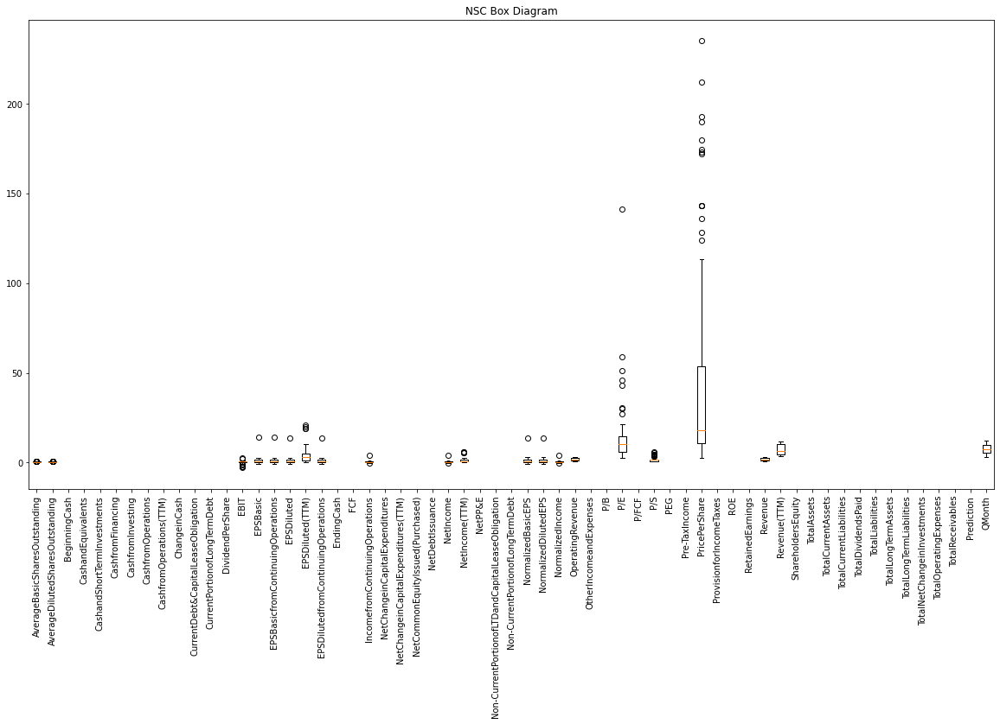

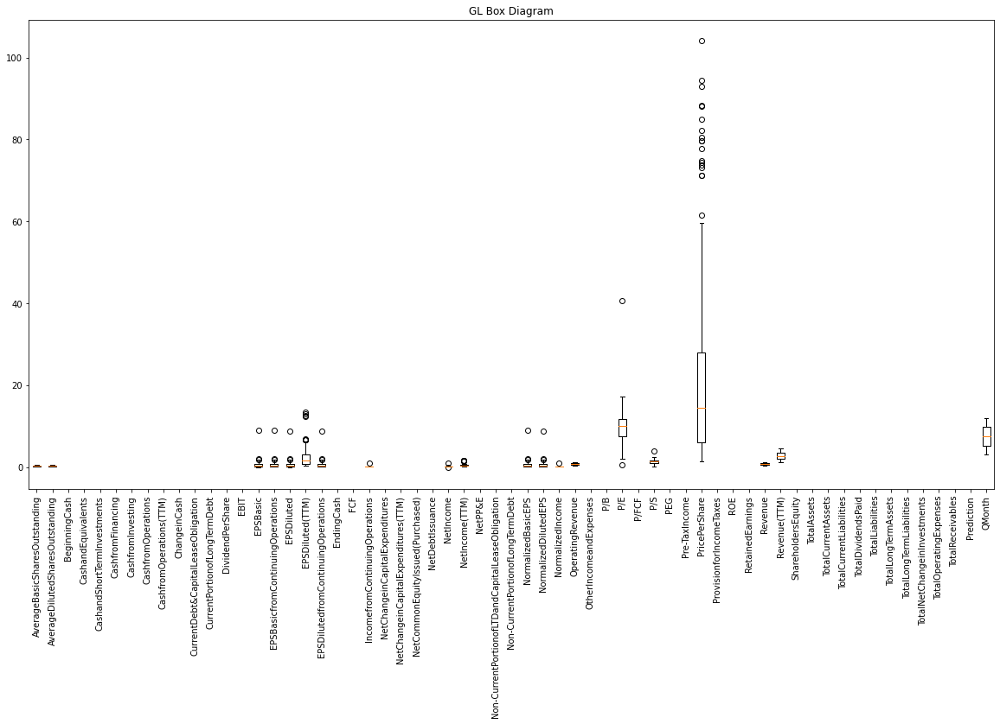

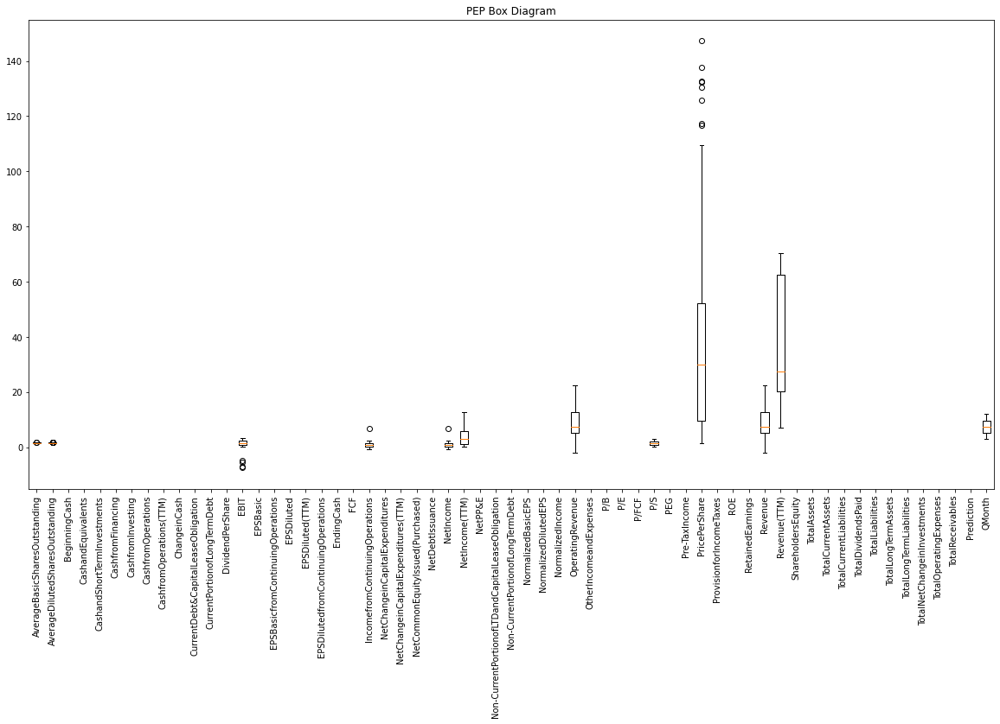

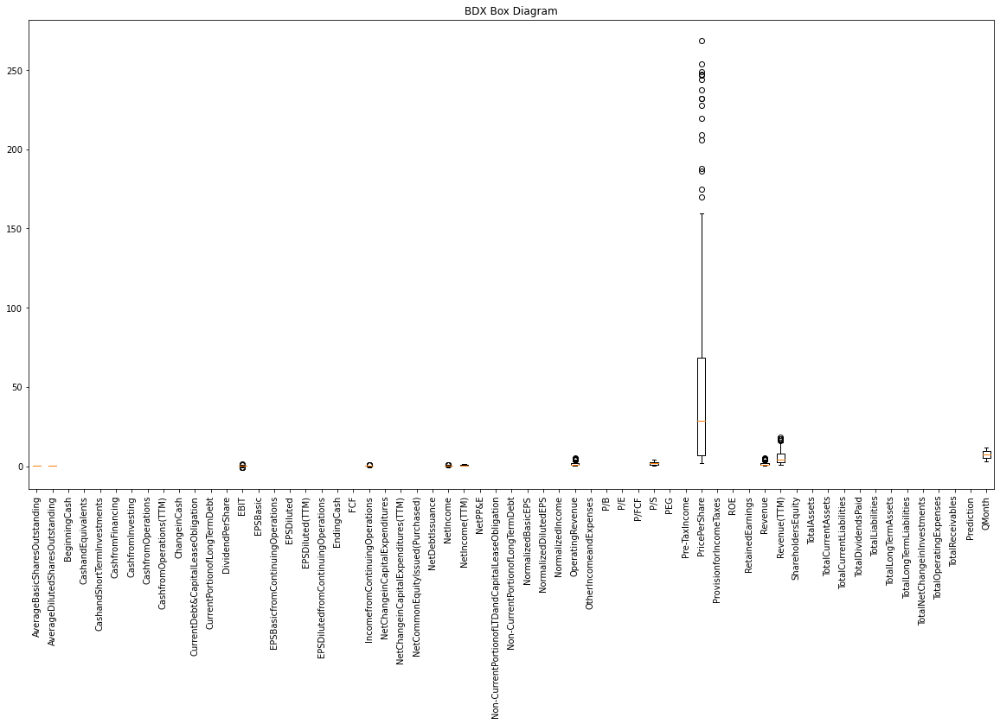

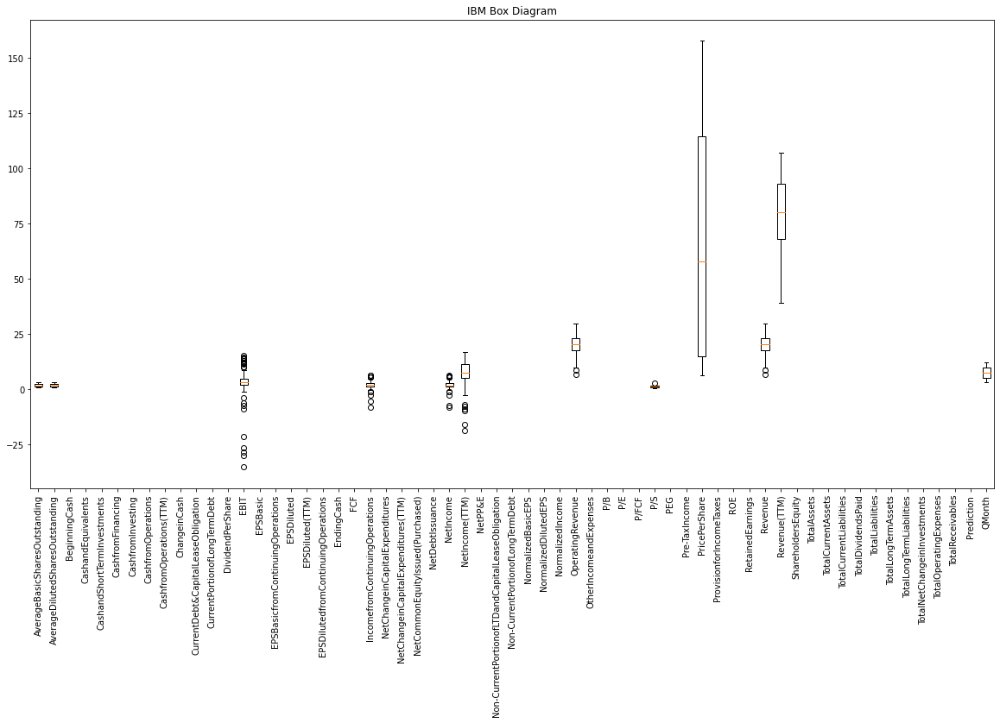

In [21]:
# Box Diagrams for numeric attributes
for stock in stock_sel:
    fig1,ax1 = plt.subplots(figsize=(20,10))
    ax1.set_title(stock+' Box Diagram')
    ax1.boxplot(data.xs(stock, level=1, axis=1), labels=data.xs(stock, level=1, axis=1).columns)
    plt.xticks(rotation=90)
    plt.show()

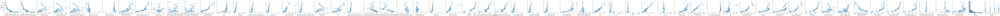

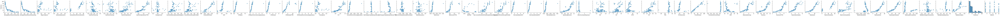

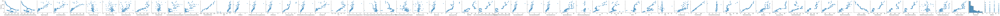

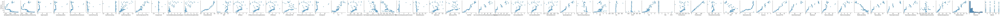

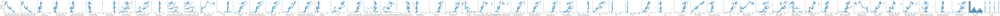

In [22]:
# Data visualization of features against dependent variable
for stock in stock_sel:
    sbn.pairplot(data.xs(stock, level=1, axis=1), y_vars=['Prediction'], kind="scatter")
    plt.show()

In [23]:
# Display visualization of correlations between features
rows= 3600
pd.set_option("display.max.rows", rows)
for stock in stock_sel:
    display(data.xs(stock, level=1, axis=1).corr().unstack().sort_values(ascending=False).drop_duplicates())

Attributes                                        Attributes                                      
QMonth                                            QMonth                                              1.000000
EPSBasicfromContinuingOperations                  EPSDilutedfromContinuingOperations                  0.999988
EPSDiluted                                        EPSBasic                                            0.999987
NormalizedDilutedEPS                              NormalizedBasicEPS                                  0.999987
Non-CurrentPortionofLTDandCapitalLeaseObligation  Non-CurrentPortionofLongTermDebt                    0.999894
AverageBasicSharesOutstanding                     AverageDilutedSharesOutstanding                     0.999107
EPSDilutedfromContinuingOperations                EPSBasic                                            0.999063
EPSBasicfromContinuingOperations                  EPSBasic                                            0.999060
EPSDiluted   

Attributes                                        Attributes                                      
QMonth                                            QMonth                                              1.000000
EndingCash                                        CashandEquivalents                                  1.000000
NormalizedBasicEPS                                NormalizedDilutedEPS                                0.999983
EPSBasicfromContinuingOperations                  EPSDilutedfromContinuingOperations                  0.999983
                                                  NormalizedBasicEPS                                  0.999973
NormalizedDilutedEPS                              EPSDilutedfromContinuingOperations                  0.999972
EPSBasicfromContinuingOperations                  NormalizedDilutedEPS                                0.999957
EPSDilutedfromContinuingOperations                NormalizedBasicEPS                                  0.999954
CashandShortT

Attributes                                        Attributes                                      
QMonth                                            QMonth                                              1.000000
EPSDilutedfromContinuingOperations                EPSBasicfromContinuingOperations                    0.999952
EPSDiluted                                        EPSBasic                                            0.999950
NormalizedDilutedEPS                              NormalizedBasicEPS                                  0.999950
CurrentPortionofLongTermDebt                      CurrentDebt&CapitalLeaseObligation                  0.999782
TotalLongTermLiabilities                          TotalLiabilities                                    0.996020
NetIncome                                         IncomefromContinuingOperations                      0.995062
PricePerShare                                     Prediction                                          0.994956
EndingCash   

Attributes                                        Attributes                                      
QMonth                                            QMonth                                              1.000000
EPSBasic                                          EPSDiluted                                          0.999930
NormalizedBasicEPS                                NormalizedDilutedEPS                                0.999910
EPSDilutedfromContinuingOperations                EPSBasicfromContinuingOperations                    0.999904
CashandEquivalents                                EndingCash                                          0.999518
TotalLiabilities                                  TotalLongTermLiabilities                            0.997942
Non-CurrentPortionofLTDandCapitalLeaseObligation  TotalLongTermLiabilities                            0.997231
AverageDilutedSharesOutstanding                   AverageBasicSharesOutstanding                       0.994542
Prediction   

Attributes                                        Attributes                                      
QMonth                                            QMonth                                              1.000000
NormalizedBasicEPS                                NormalizedDilutedEPS                                0.999959
EPSDiluted                                        EPSBasic                                            0.999959
EPSDilutedfromContinuingOperations                EPSBasicfromContinuingOperations                    0.999959
AverageBasicSharesOutstanding                     AverageDilutedSharesOutstanding                     0.999157
Non-CurrentPortionofLongTermDebt                  Non-CurrentPortionofLTDandCapitalLeaseObligation    0.998645
CurrentDebt&CapitalLeaseObligation                CurrentPortionofLongTermDebt                        0.995488
FCF                                               CashfromOperations(TTM)                             0.985838
CashandEquiva

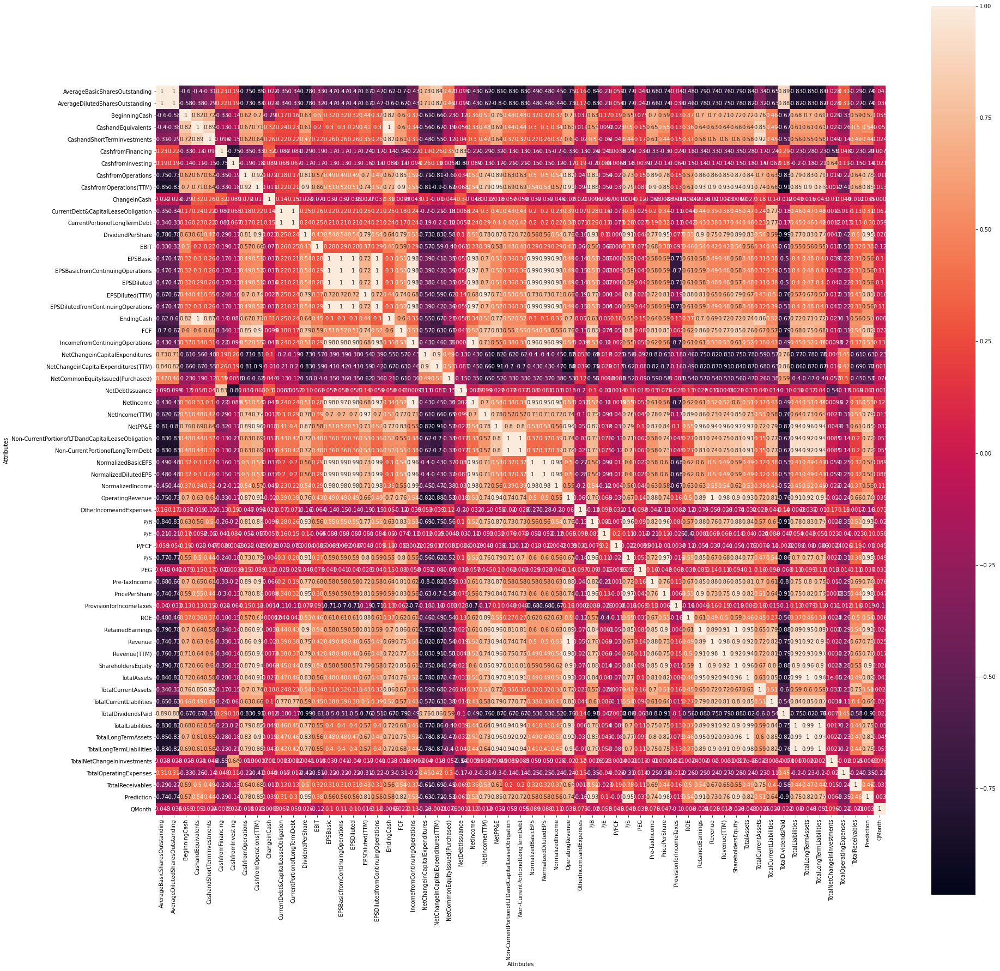

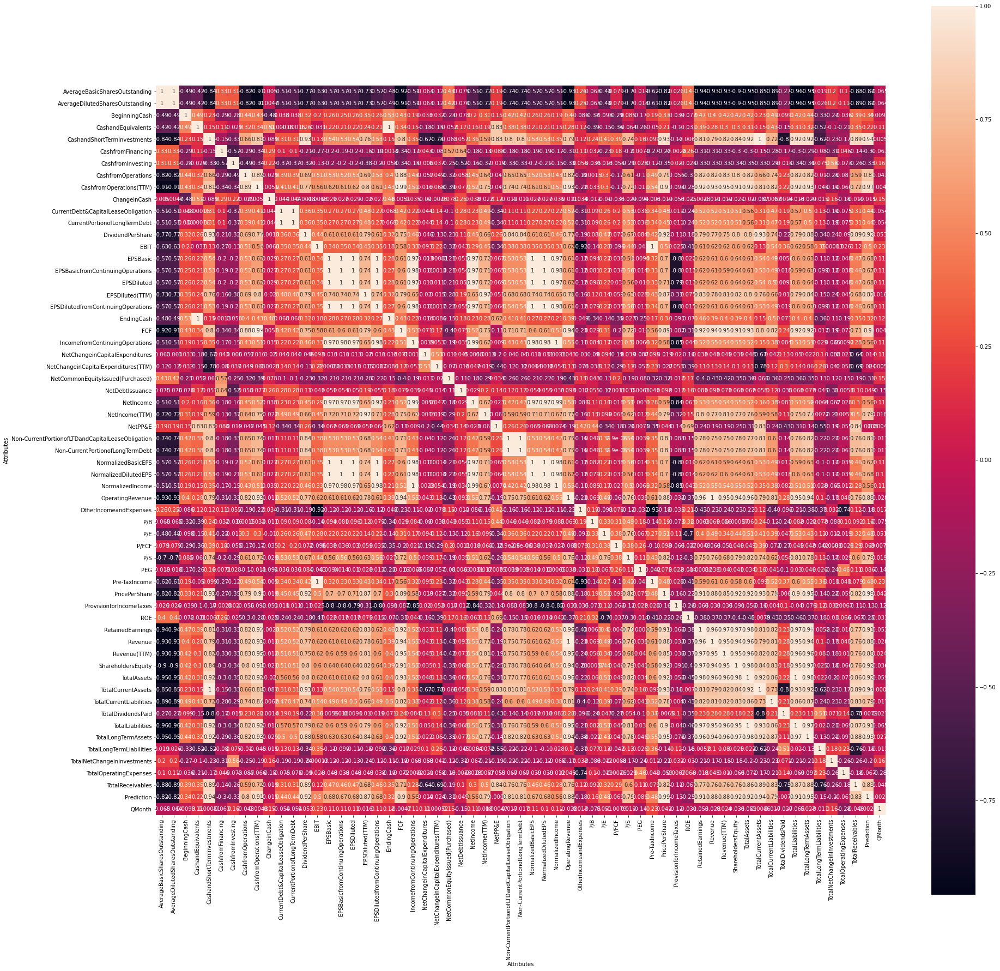

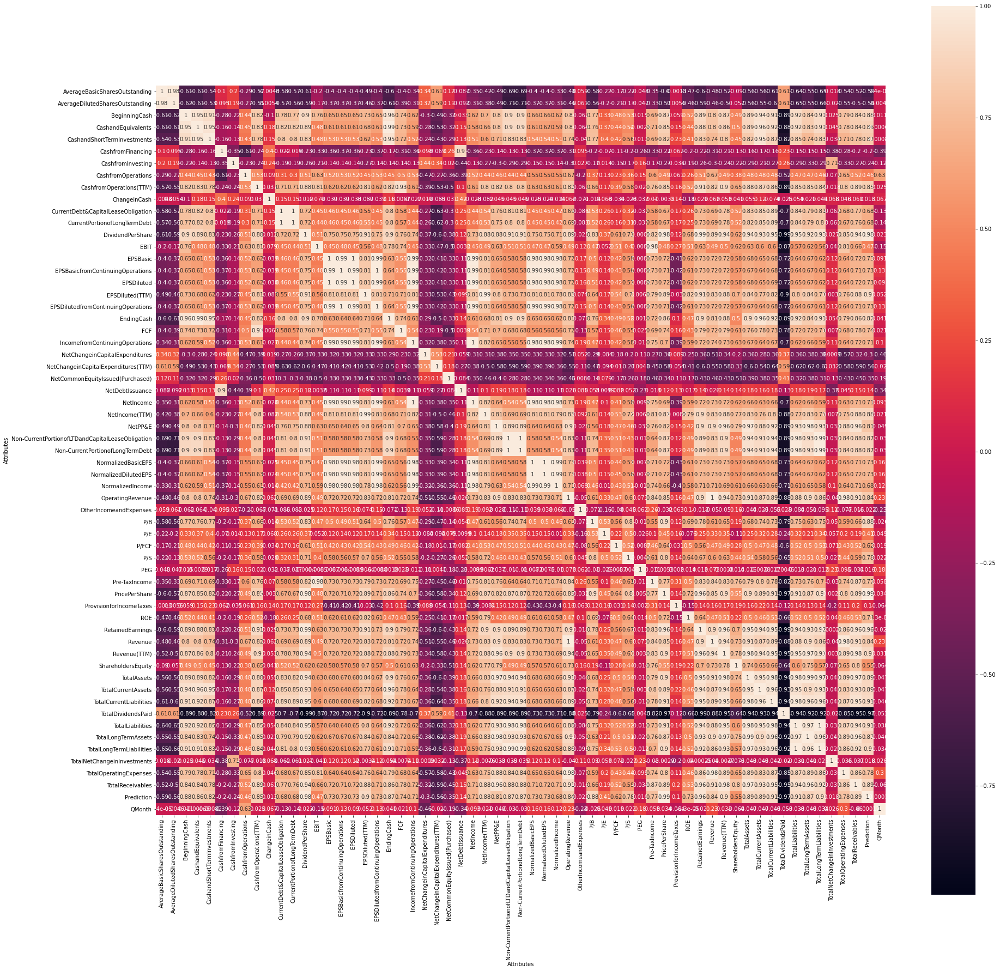

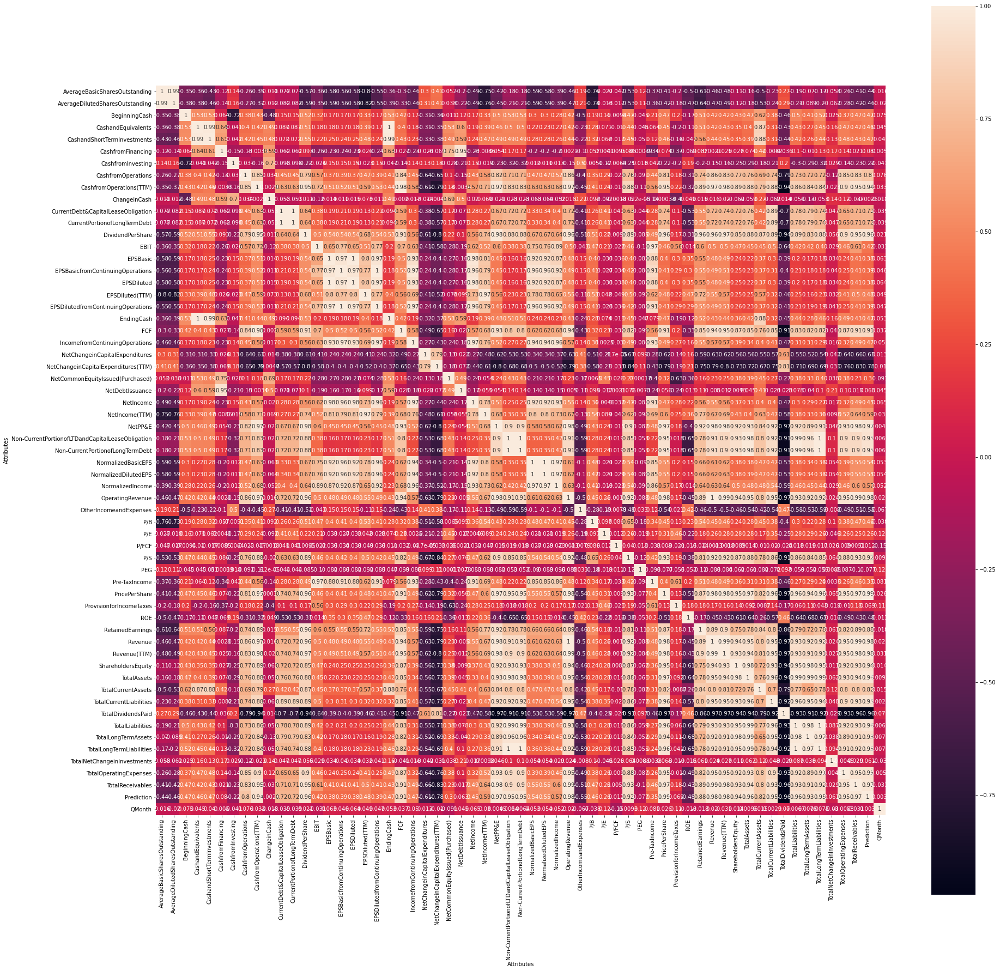

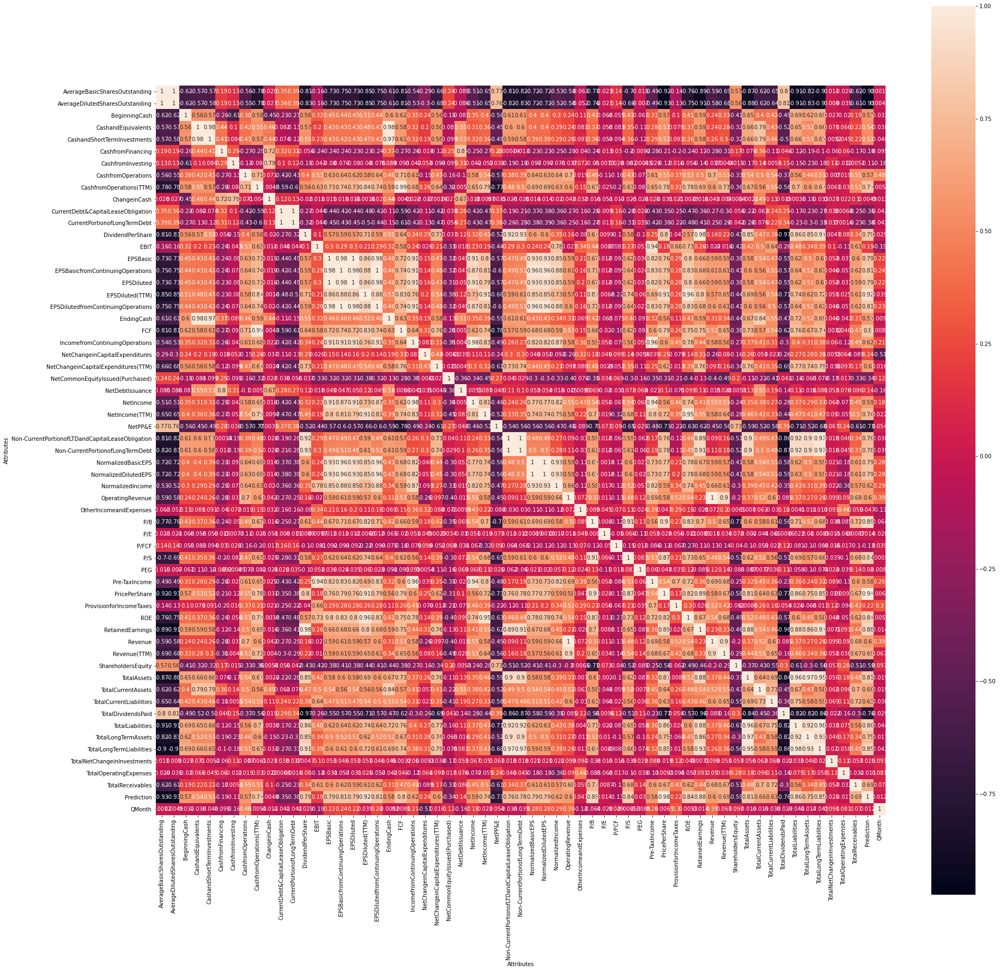

In [24]:
# Heat map of co-relation between numeric attributes
for stock in stock_sel:
    fig, ax = plt.subplots(figsize=(30,30))
    sbn.heatmap(data.xs(stock, level=1, axis=1).corr(), square=True, annot=True, ax=ax)

In [25]:
# Null values per Attribute in the whole dataset
atts = set(data.columns.get_level_values(0))
att_miss = pd.Series(dtype='int64')
for att in atts:
    att_miss[att] = data.xs(att, level=0, axis=1).isnull().sum().sum()
att_miss.sort_values(ascending=False)

TotalOperatingExpenses                              137
EndingCash                                          129
OtherIncomeandExpenses                              127
TotalNetChangeinInvestments                         127
NetPP&E                                             124
BeginningCash                                       123
NetCommonEquityIssued(Purchased)                    117
TotalReceivables                                    115
CashandShortTermInvestments                         114
CashandEquivalents                                  114
TotalCurrentAssets                                  114
ChangeinCash                                        112
FCF                                                 112
CashfromOperations(TTM)                             112
NetChangeinCapitalExpenditures(TTM)                 112
P/FCF                                               112
ROE                                                 109
TotalDividendsPaid                              

In [26]:
# Null values per Quarter in the whole dataset
quarters = list(data.index)
q_miss = pd.Series(dtype='int64')
for quarter in quarters:
    q_miss[quarter] = data.loc[quarter].isnull().sum().sum()
q_miss.sort_values(ascending=False)

1985-03    199
1985-06    199
1986-03    191
1988-03    191
1985-09    190
1987-03    190
1987-06    189
1988-06    189
1986-06    189
1987-09    181
1986-09    181
1988-09    178
1989-03    163
1985-12    152
1986-12    151
1987-12    149
1988-12    142
1989-06    123
1989-09    110
1989-12     78
2020-12     41
1990-06     34
1990-03     30
1990-09     29
2010-09     22
2000-12     17
1990-12     13
1991-06     12
1991-09     12
1991-03     11
1991-12     11
1992-06     10
1992-09     10
1993-06     10
1993-09     10
1997-12      9
1998-03      9
1998-09      9
1993-12      9
1992-12      9
1993-03      9
1992-03      8
1994-12      7
1997-03      7
1997-06      7
1997-09      7
1994-03      6
1999-09      6
1999-06      6
1999-03      6
1998-06      6
1994-09      6
1994-06      6
1996-03      6
1995-03      6
1995-06      6
1995-09      6
1996-09      5
1996-06      5
2007-12      4
1998-12      4
1996-12      4
2020-03      3
2008-06      3
2009-09      3
2019-03      3
2006-12   

<AxesSubplot:>

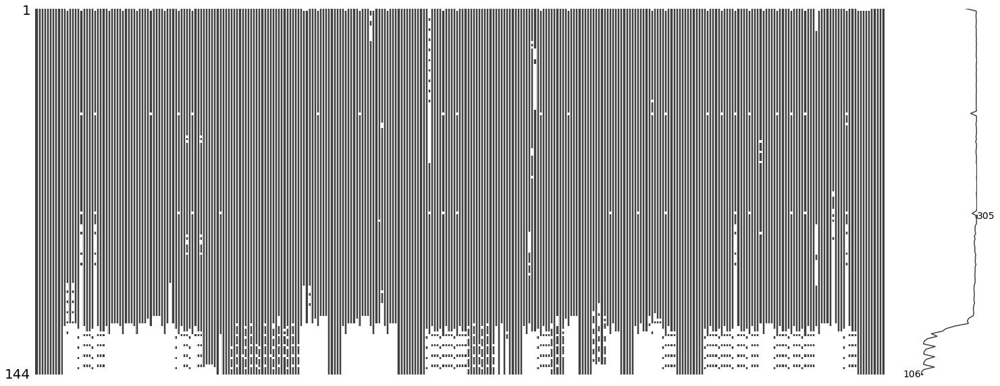

In [27]:
import missingno as msno
msno.matrix(data)

### 1.2.1 Observations
- Los valores extremos pueden ser de utilidad para el entrenamiento y no se deberían eliminar.
- Se pueden observar algunos patrones entre las correlaciones de cada acción.
- Se debe tratar la alta correlación existente entre algunos atributos.
- Existe una cantidad importante de datos nulos, la mayor parte de estos se concentran en años anteriores al periodo 1990-01. Siendo 300 el número máximo de datos faltantes que podrían haber por fila. Si se eliminar los anteriores a esta fecha se dispondrían de 20 registros menos, lo cual dejaría el conjunto de datos con 124 periodos.

## 1.3 Data Cleansing

In [28]:
data = pd.read_csv(PATH+'PCA_features_dataset.csv', header=[0,1], index_col=0, low_memory=False)
data.set_index(pd.DatetimeIndex(list(data.index)).strftime('%Y-%m'), inplace=True)
data

Attributes AverageBasicSharesOutstanding                                    \
Symbol                               BDX       GL      IBM      NSC    PEP   
2020-12                          0.29059  0.10420  0.89260  0.25330  1.379   
2020-09                          0.29043  0.10615  0.89140  0.25460  1.384   
2020-06                          0.28238  0.10644  0.88944  0.25540  1.387   
2020-03                          0.27201  0.10729  0.88800  0.25730  1.390   
2019-12                          0.27110  0.10811  0.88704  0.25940  1.393   
2019-09                          0.27062  0.10881  0.88600  0.26210  1.397   
2019-06                          0.27025  0.10965  0.88627  0.26480  1.401   
2019-03                          0.26988  0.11030  0.88960  0.26710  1.406   
2018-12                          0.26904  0.11139  0.90139  0.27050  1.409   
2018-09                          0.26861  0.11259  0.91120  0.27550  1.414   
2018-06                          0.26784  0.11335  0.91510  0.28130  1.417   
2018-03                          0.26734  0.11418  0.92068  0.28350  1.420   
2017-12                          0.23004  0.11505  0.92451  0.28520  1.419   
2017-09                          0.22832  0.11592  0.92944  0.28710  1.425   
2017-06                          0.22081  0.11665  0.93492  0.28900  1.428   
2017-03                          0.21358  0.11777  0.94244  0.29030  1.428   
2016-12                          0.21306  0.11857  0.94861  0.29090  1.427   
2016-09                          0.21358  0.11948  0.95400  0.29270  1.438   
2016-06                          0.21308  0.12048  0.95740  0.29470  1.443   
2016-03                          0.21247  0.12148  0.96170  0.29720  1.446   
2015-12                          0.21169  0.12301  0.96958  0.30010  1.451   
2015-09                          0.21108  0.12446  0.97510  0.30010  1.467   
2015-06                          0.21018  0.12582  0.98230  0.30290  1.476   
2015-03                          0.19608  0.12712  0.98810  0.30680  1.484   
2014-12                          0.19284  0.12830  0.99039  0.30910  1.491   
2014-09                          0.19232  0.12997  0.99180  0.30940  1.507   
2014-06                          0.19305  0.13149  0.99960  0.30950  1.515   
2014-03                          0.19361  0.13316  1.03500  0.30950  1.524   
2013-12                          0.19420  0.13506  1.07300  0.30860  1.529   
2013-09                          0.19469  0.13690  1.09100  0.31040  1.542   
2013-06                          0.19488  0.13829  1.10100  0.31410  1.548   
2013-03                          0.19461  0.14037  1.11400  0.31450  1.544   
2012-12                          0.19643  0.14159  1.12500  0.31490  1.542   
2012-09                          0.19902  0.14269  1.13700  0.31770  1.556   
2012-06                          0.20202  0.14534  1.14900  0.32270  1.563   
2012-03                          0.20643  0.15010  1.15900  0.32830  1.568   
2011-12                          0.21430  0.15195  1.17200  0.33260  1.561   
2011-09                          0.21668  0.15717  1.18900  0.34320  1.578   
2011-06                          0.21897  0.16652  1.20500  0.35100  1.583   
2011-03                          0.22089  0.17523  1.22200  0.35520  1.583   
2010-12                          0.22808  0.17942  1.24000  0.36050  1.581   
2010-09                          0.23136  0.18175  1.25500  0.36630  1.588   
2010-06                          0.23324  0.27681  1.27900  0.36970  1.608   
2010-03                          0.23532  0.18640  1.30100  0.36950  1.582   
2009-12                          0.23736  0.18628  1.31800  0.36800  1.561   
2009-09                          0.23915  0.18618  1.32000  0.36730  1.558   
2009-06                          0.24011  0.18615  1.32600  0.36680  1.557   
2009-03                          0.24024  0.18872  1.34400  0.36620  1.555   
2008-12                          0.24240  0.19117  1.34700  0.36600  1.546   
2008-09               

In [29]:
# Replace inf values by nan
data.replace(np.inf, np.nan, inplace=True)
# Fill None values with the previous valid value
data.fillna(method='ffill', axis=0, inplace=True)
data.fillna(method='bfill', axis=0, inplace=True)
data.drop(['2020-12'], axis=0, inplace=True)
data

Attributes AverageBasicSharesOutstanding                                    \
Symbol                               BDX       GL      IBM      NSC    PEP   
2020-09                          0.29043  0.10615  0.89140  0.25460  1.384   
2020-06                          0.28238  0.10644  0.88944  0.25540  1.387   
2020-03                          0.27201  0.10729  0.88800  0.25730  1.390   
2019-12                          0.27110  0.10811  0.88704  0.25940  1.393   
2019-09                          0.27062  0.10881  0.88600  0.26210  1.397   
2019-06                          0.27025  0.10965  0.88627  0.26480  1.401   
2019-03                          0.26988  0.11030  0.88960  0.26710  1.406   
2018-12                          0.26904  0.11139  0.90139  0.27050  1.409   
2018-09                          0.26861  0.11259  0.91120  0.27550  1.414   
2018-06                          0.26784  0.11335  0.91510  0.28130  1.417   
2018-03                          0.26734  0.11418  0.92068  0.28350  1.420   
2017-12                          0.23004  0.11505  0.92451  0.28520  1.419   
2017-09                          0.22832  0.11592  0.92944  0.28710  1.425   
2017-06                          0.22081  0.11665  0.93492  0.28900  1.428   
2017-03                          0.21358  0.11777  0.94244  0.29030  1.428   
2016-12                          0.21306  0.11857  0.94861  0.29090  1.427   
2016-09                          0.21358  0.11948  0.95400  0.29270  1.438   
2016-06                          0.21308  0.12048  0.95740  0.29470  1.443   
2016-03                          0.21247  0.12148  0.96170  0.29720  1.446   
2015-12                          0.21169  0.12301  0.96958  0.30010  1.451   
2015-09                          0.21108  0.12446  0.97510  0.30010  1.467   
2015-06                          0.21018  0.12582  0.98230  0.30290  1.476   
2015-03                          0.19608  0.12712  0.98810  0.30680  1.484   
2014-12                          0.19284  0.12830  0.99039  0.30910  1.491   
2014-09                          0.19232  0.12997  0.99180  0.30940  1.507   
2014-06                          0.19305  0.13149  0.99960  0.30950  1.515   
2014-03                          0.19361  0.13316  1.03500  0.30950  1.524   
2013-12                          0.19420  0.13506  1.07300  0.30860  1.529   
2013-09                          0.19469  0.13690  1.09100  0.31040  1.542   
2013-06                          0.19488  0.13829  1.10100  0.31410  1.548   
2013-03                          0.19461  0.14037  1.11400  0.31450  1.544   
2012-12                          0.19643  0.14159  1.12500  0.31490  1.542   
2012-09                          0.19902  0.14269  1.13700  0.31770  1.556   
2012-06                          0.20202  0.14534  1.14900  0.32270  1.563   
2012-03                          0.20643  0.15010  1.15900  0.32830  1.568   
2011-12                          0.21430  0.15195  1.17200  0.33260  1.561   
2011-09                          0.21668  0.15717  1.18900  0.34320  1.578   
2011-06                          0.21897  0.16652  1.20500  0.35100  1.583   
2011-03                          0.22089  0.17523  1.22200  0.35520  1.583   
2010-12                          0.22808  0.17942  1.24000  0.36050  1.581   
2010-09                          0.23136  0.18175  1.25500  0.36630  1.588   
2010-06                          0.23324  0.27681  1.27900  0.36970  1.608   
2010-03                          0.23532  0.18640  1.30100  0.36950  1.582   
2009-12                          0.23736  0.18628  1.31800  0.36800  1.561   
2009-09                          0.23915  0.18618  1.32000  0.36730  1.558   
2009-06                          0.24011  0.18615  1.32600  0.36680  1.557   
2009-03                          0.24024  0.18872  1.34400  0.36620  1.555   
2008-12                          0.24240  0.19117  1.34700  0.36600  1.546   
2008-09                          0.24386  0.19579  1.36000  0.37250  1.564   
2008-06               

## 1.4 Data Transformation

In [30]:
X = data.drop(['Prediction'], level=0, axis=1)
y = data['Prediction']
display(X.shape, y.shape)

(143, 300)

(143, 5)

In [31]:
def dfpca(stockName, X, comp):
    scaler = StandardScaler()
    Xsc = scaler.fit_transform(X.xs(stockName, level=1, axis=1))
    pca = PCA(n_components=comp)
    principalComponents = pca.fit_transform(Xsc)
    df = pd.DataFrame(data = principalComponents, index=X.xs(stockName, level=1, axis=1).index)
    df['Prediction'] = y[stockName].values
    expVar = np.sum(pca.explained_variance_ratio_)
    return df, expVar

In [32]:
stock_sel = ['NSC', 'GL', 'PEP', 'BDX', 'IBM']
dfsPCA = {}
components = 1
mean_exp = 0
while mean_exp < 0.95:
    sum_exp = []
    for stock in stock_sel:
        dfsPCA[stock], exp = dfpca(stock, X, components)
        sum_exp.append(exp)
    mean_exp = np.mean(sum_exp)
    print("Components: {}\nMean Explained Variance Ratio: {}\n\n".format(components, mean_exp))
    components += 1

Components: 1
Mean Explained Variance Ratio: 0.5062781042712141


Components: 2
Mean Explained Variance Ratio: 0.6176938192951811


Components: 3
Mean Explained Variance Ratio: 0.6839433058597663


Components: 4
Mean Explained Variance Ratio: 0.7360326670044496


Components: 5
Mean Explained Variance Ratio: 0.7737272103421127


Components: 6
Mean Explained Variance Ratio: 0.8033717563400506


Components: 7
Mean Explained Variance Ratio: 0.8282736385237228


Components: 8
Mean Explained Variance Ratio: 0.8505137193223277


Components: 9
Mean Explained Variance Ratio: 0.8696660883460723


Components: 10
Mean Explained Variance Ratio: 0.8876676761875167


Components: 11
Mean Explained Variance Ratio: 0.903144769001598


Components: 12
Mean Explained Variance Ratio: 0.9175673296216349


Components: 13
Mean Explained Variance Ratio: 0.9308796195914703


Components: 14
Mean Explained Variance Ratio: 0.942290791449029


Components: 15
Mean Explained Variance Ratio: 0.951795804619765




In [33]:
dfsPCA

{'NSC':                  0          1         2          3         4         5  \
 2020-09  10.382192  -1.369503 -1.147559   0.203166 -0.910767  0.928021   
 2020-06   8.341831  -2.103003 -0.152875   1.511276 -0.789548  2.099578   
 2020-03   8.934757  -0.783882  1.586509   0.159421 -2.948239  1.235133   
 2019-12  10.437156  -0.233046  1.086127   0.279222 -2.452453  1.570230   
 2019-09  10.630438  -0.361363  2.081662   0.039580 -1.097812  2.539548   
 2019-06  10.632851   0.378490  1.327435  -0.475096 -3.237919  0.677361   
 2019-03  10.481218  -0.213865  2.178838  -0.479749 -1.006349  2.278223   
 2018-12   9.948720   0.193045  1.359861  -0.862327 -2.185582 -0.101933   
 2018-09  12.327515   1.061320 -0.879143   1.673576 -3.536073  6.239902   
 2018-06  10.799617   1.370031 -0.488036  -2.141630 -3.817109  0.195753   
 2018-03  10.038001  -0.192888 -0.796401   1.042720 -0.071151  3.892733   
 2017-12  20.596259  26.235143  2.055313  -1.910612  5.434190 -1.463902   
 2017-09   7.58168

## 1.5 Data Visualization

In [34]:
dfsPCA['IBM']

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Prediction
2020-09,-5.912077,5.709563,-2.244590,-0.927109,1.135768,-0.647837,0.577302,0.456300,-1.075738,0.968899,-0.581537,-1.368972,1.051900,0.151161,-1.160271,122.700371
2020-06,-5.392398,6.026219,-2.389430,-1.816439,0.521944,-0.262263,-0.057232,-0.363083,-1.291212,0.511821,0.033483,0.837855,-0.712962,-0.340887,-0.236925,118.349457
2020-03,-4.718536,6.898844,-1.694887,-1.219123,0.240185,0.750550,1.699492,-0.538686,-1.147311,-0.294292,-0.400114,0.124305,-0.568438,0.933578,-0.986986,115.955757
2019-12,-8.089670,1.630750,-2.404746,-2.815232,1.901964,0.137128,1.816769,1.153231,-2.943404,0.318266,-0.529679,-0.549126,-0.038703,0.838660,-1.496335,105.098518
2019-09,-7.003140,4.374434,-3.487676,-12.729911,0.724731,-3.803638,-0.060495,5.871534,6.826394,0.056659,0.652392,1.377736,1.285570,0.021375,-0.342733,125.681244
2019-06,-9.876203,11.892410,-1.182100,15.523244,1.368627,-1.179438,-1.517345,2.476421,2.559260,-0.024580,1.065982,2.022417,0.928952,0.483582,-0.330804,134.759933
2019-03,-5.666357,5.452144,-1.087756,1.761075,-0.189328,0.607749,-0.343453,-0.251089,0.015547,0.207187,0.634356,0.555136,-0.007498,-0.149878,-0.037883,126.303001
2018-12,-5.722865,1.470206,0.043794,-0.538305,0.302543,-0.990716,0.783857,0.134230,-0.665493,1.664149,0.378992,-3.458784,3.164542,-0.438397,-0.574993,127.716805
2018-09,-5.777750,2.779179,-1.301859,-0.306262,1.556836,0.870884,-1.030041,0.523691,-0.939633,0.031727,0.555531,2.096321,-1.285772,-0.627029,0.247656,101.703552
2018-06,-5.288286,2.466713,-1.634325,-1.015752,0.486224,0.709459,-0.062809,-0.125810,-0.924598,0.336765,-0.076106,-0.214329,0.415191,0.028538,0.145018,133.590149


'NSC'

'GL'

'PEP'

'BDX'

'IBM'

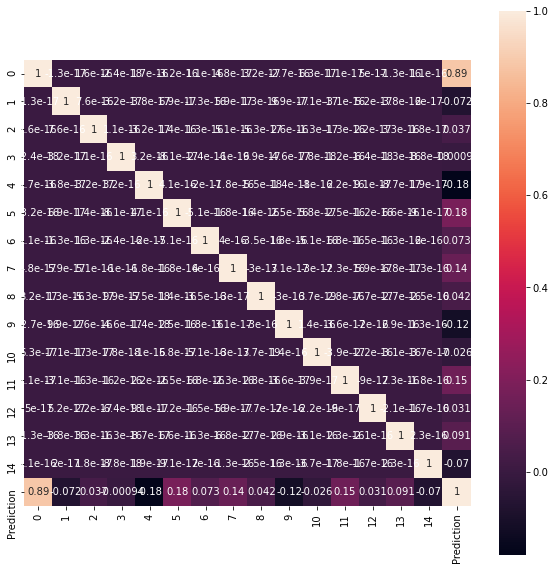

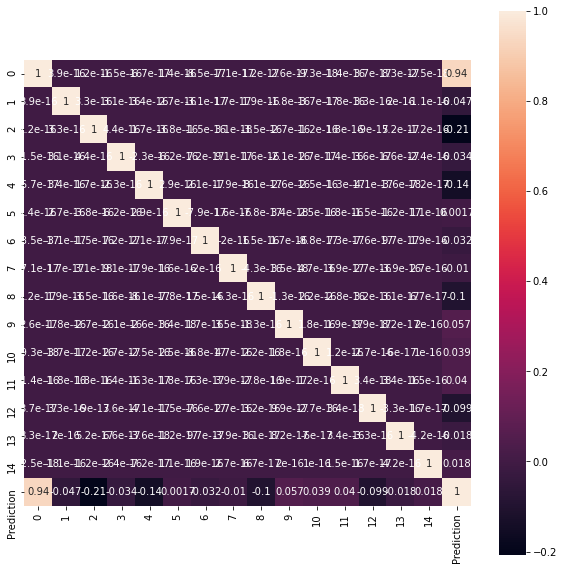

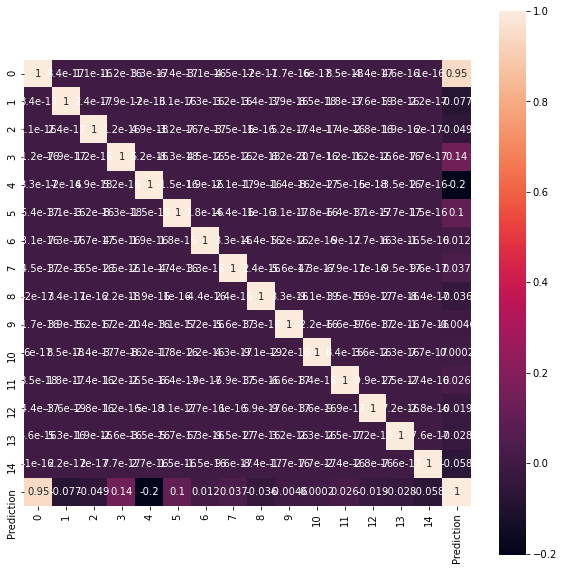

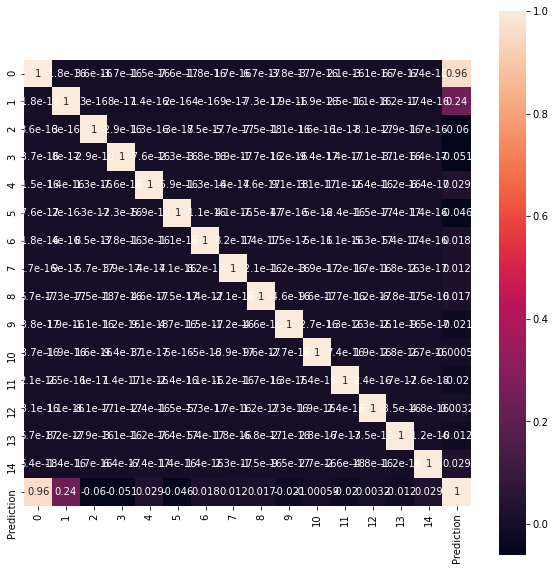

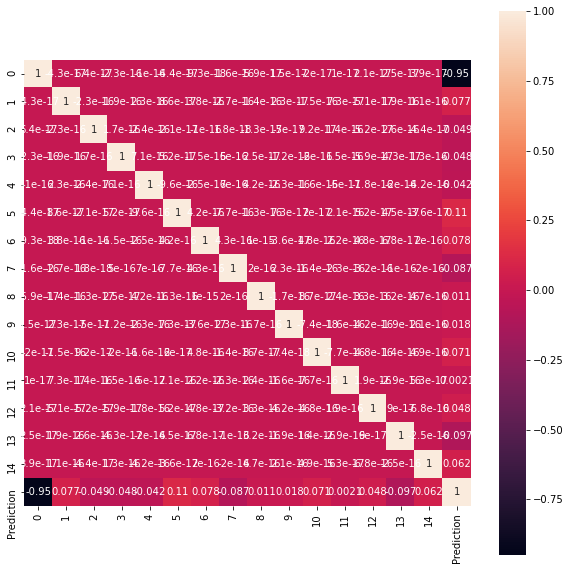

In [35]:
# Heat map of co-relation between numeric attributes
for stock in stock_sel:
    fig, ax = plt.subplots(figsize=(10,10))
    display(stock)
    sbn.heatmap(dfsPCA[stock].corr(), square=True, annot=True, ax=ax)

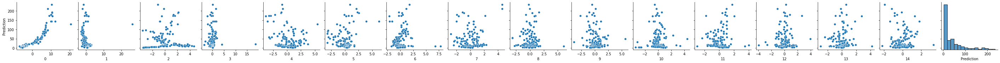

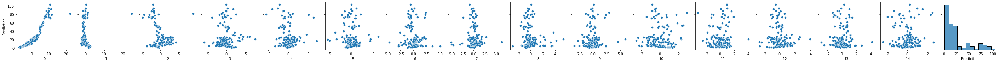

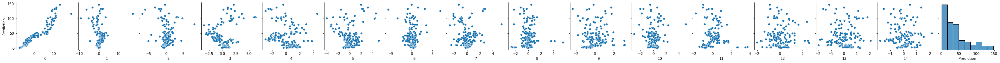

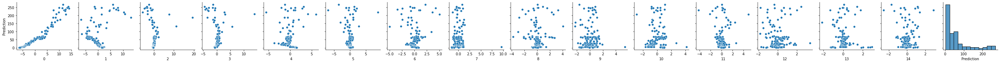

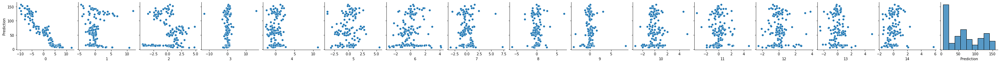

In [36]:
for stock in stock_sel:
    sbn.pairplot(dfsPCA[stock], y_vars=['Prediction'], kind="scatter")
    plt.show()

In [37]:
for stock in stock_sel:
    dfsPCA[stock].to_csv(PATH+'{}_PCA_dataset.csv'.format(stock))